# **Nhóm 13**


| *Tên*              |**MSSV**        |     
|----------------------|----------------|
|Lê Quốc An            |22280001        |
|Nguyễn Công Tiến Dũng |22280014        |
|Nguyễn Thiên Phúc     |22280067        |
|Lê Hoàng Nguyên       |22280061        |

#  **Đồ án giữa kỳ môn nhận dạng mẫu**

## Đề tài: Mental Attention States Classification Using EEG Data

## Introduce
- **Mục tiêu**: Phân tích đánh giá về dữ liệu EEG từ đó xây dựng một mô hình có khả năng phân loại chính xác các trạng thái tập trung tinh thần của con người dựa trên dữ liệu EEG.

- **Về tập dữ liệu**: là tập dữ liệu thu thập tín hiệu từ thiết bị EMOTIV EEG để thu tín hiệu từ các thiết bị thu sóng não chuyên dụng. Dữ liệu được thu thập thông qua 34 cuộc thử nghiệm. Có 5 người tham gia, mỗi người được ghi lại dữ liệu ở 7 lần đo, người cuối cùng không chỉ được đo dữ liệu 6 lần. Tần số lấy mẫu được sử dụng là 128 Hz. Mỗi cuộc thí nghiệm kéo dài trong khoảng 35 đến 55 phút. Trong 10 phút đầu người tham gia được giữ tỉnh táo và tập trung để tham gia lái tàu trên máy tính với tên gọi “Microsoft Train Simulator". Trong 10 phút tiếp theo người tham gia được yêu cầu ngừng tập trung vào việc điều khiển tàu, không thao tác với chương trình và không chú ý đến những gì diễn ra trên màn hình. Tuy nhiên, họ không được phép nhắm mắt hoặc ngủ gật. 10 phút cuối, người tham gia được phép thư giãn hoàn toàn, có thể nhắm mắt và ngủ gật theo ý muốn.

## Approach
 Xây dựng hướng tiếp cận cho bài toán theo các bước:
 - Tiền xử lí dữ liệu: Áp dụng bộ lọc nhiễu của các band tần số để loại bỏ nhiễu. Kết hợp kỹ thuật ICA để lọc nhiễu từ chuyển động của tim, và mắt.
 - Trích xuất đặc trưng: trích xuất bằng cách biến đổi dữ liệu từ miền thời gian sang miền tần số mà lấy ra các đặc trưng của phổ công suất.
 - Áp dụng các mô hình máy học để xây dựng bộ phân loại trạng thái dựa trên đặc trưng trích xuất được.


 *Môi trường triển khải Google Colab*


## Download Dataset and prepare environment

In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("inancigdem/eeg-data-for-mental-attention-state-detection")

print("Path to dataset files:", path)

100%|██████████| 557M/557M [00:10<00:00, 57.6MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1


In [2]:
!echo mne > requirements.txt
!echo torchmetrics >> requirements.txt
!echo torchsummary >> requirements.txt

In [3]:
!pip install -r requirements.txt -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 58.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 45.5 MB/s eta 0:00:00


In [99]:
import numpy as np
import pandas as pd
import scipy.io
import matplotlib.pyplot as plt
import seaborn as sns
import os
import mne
import time

from scipy import signal
from scipy.fft import fft, fftshift, fftfreq
from scipy.signal import butter, iirnotch, filtfilt, lfilter
from scipy.stats import skew, kurtosis
import scipy.io

from mne import create_info, EpochsArray
from mne.preprocessing import ICA
from mne.preprocessing import create_eog_epochs

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score, ConfusionMatrixDisplay


import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import DataLoader, TensorDataset
from torchmetrics import Accuracy


import time
import warnings
warnings.filterwarnings("ignore")

## 1.Load Data, EDA and Preprocessing

### 1.1 Load Data


In [5]:
folder_path = path + '/EEG Data'
file_paths = []

for dirname, _, filenames in os.walk(folder_path):
    for filename in filenames:
        file_paths.append(os.path.join(dirname, filename))

file_paths

['/root/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/eeg_record9.mat',
 '/root/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/eeg_record15.mat',
 '/root/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/eeg_record4.mat',
 '/root/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/eeg_record1.mat',
 '/root/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/eeg_record19.mat',
 '/root/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/eeg_record10.mat',
 '/root/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/versions/1/EEG Data/eeg_record13.mat',
 '/root/.cache/kagglehub/datasets/inancigdem/eeg-data-for-mental-attention-state-detection/ve

**Tổng quan dữ lệu:** Mỗi tập dữ liệu là một bản ghi lại tín hiệu sóng não thông qua quá trình thử nghiệm lái tàu mô phỏng trên máy tính có tên là "Microsoft Train Simulator". Với 5 người tham gia, mỗi file sẽ kéo dài trong khoảng 35-55 phút, mỗi người thực hiện 7 lần thử nghiệm.

Trong bản ghi tác giả có đề cập trong bài báo 2 bản ghi đầu của mỗi đối tượng sẽ để làm quen nên ta sẽ chỉ lấy 5 bản ghi cuối cùng của mỗi người tham gia, và người thứ 5 sẽ không được ghi lại ở bản ghi thứ 7

In [6]:
def load_subject_data(folder_path, subjects, useful_channels):
    """
    Hàm đọc dữ liệu từ các file .mat cho từng đối tượng và lưu toàn bộ dữ liệu

      Parameters:
          folder_path (str): Đường dẫn đến thư mục chứa các file .mat.
        subjects (dict): Dictionary chứa thông tin thí nghiệm của từng người.
        useful_channels (array-like): Danh sách các kênh dữ liệu cần trích xuất.

    Returns:
        dict: Dictionary chứa dữ liệu cho từng đối tượng với các lần thí nghiệm.
    """
    all_subject_data = {}  # Dictionary để lưu dữ liệu toàn bộ các đối tượng

    for subject_name, trials in subjects.items():
        subject_data = {}  # Dictionary lưu dữ liệu từng lần thí nghiệm của đối tượng
        for trial_name, file_name in trials.items():
            file_path = os.path.join(folder_path, file_name + '.mat')
            if os.path.exists(file_path):  # Kiểm tra file có tồn tại
                mat = scipy.io.loadmat(file_path)
                data = mat['o']['data'][0, 0]

                # Trích xuất dữ liệu các kênh cần thiết
                subject_data[trial_name] = data[:, useful_channels].copy()
            else:
                print(f"File {file_name} không tồn tại.")

        # Lưu dữ liệu của đối tượng vào dictionary chính
        all_subject_data[subject_name] = subject_data

    return all_subject_data

def create_subject_objects(*subjects):
    """
    Tạo các đối tượng từ tên file EEG ứng với từng ngày thí nghiệm.

    Parameters:
        *subjects (dict): Các dictionary chứa tên file của từng người.

    Returns:
        dict: Một dictionary chứa thông tin các lần thí nghiệm của từng người.
    """
    all_subjects = {}
    for i, files in enumerate(subjects, start=1):
        subject_data = {}
        for day, file_name in files.items():
            subject_data[day] = file_name
        all_subjects[f"Subject_{i}"] = subject_data
    return all_subjects


# Dữ liệu của các đối tượng
subj1_files = {'Day_1': 'eeg_record3', 'Day_2': 'eeg_record4', 'Day_3': 'eeg_record5',
               'Day_4': 'eeg_record6', 'Day_5': 'eeg_record7'}
subj2_files = {'Day_1': 'eeg_record10', 'Day_2': 'eeg_record11', 'Day_3': 'eeg_record12',
               'Day_4': 'eeg_record13', 'Day_5': 'eeg_record14'}
subj3_files = {'Day_1': 'eeg_record17', 'Day_2': 'eeg_record18', 'Day_3': 'eeg_record19',
               'Day_4': 'eeg_record20', 'Day_5': 'eeg_record21'}
subj4_files = {'Day_1': 'eeg_record24', 'Day_2': 'eeg_record25', 'Day_3': 'eeg_record26',
               'Day_4': 'eeg_record27', 'Day_5': 'eeg_record28'}
subj5_files = {'Day_1': 'eeg_record31', 'Day_2': 'eeg_record32', 'Day_3': 'eeg_record33',
               'Day_4': 'eeg_record34'}

# Tạo các đối tượng
subjects = create_subject_objects(subj1_files, subj2_files, subj3_files, subj4_files, subj5_files)

# Danh sách các kênh cần trích xuất
useful_channels = np.array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]) + 3

# Gọi hàm load dữ liệu
all_subject_data = load_subject_data(folder_path, subjects, useful_channels)

# Kiểm tra dữ liệu
for subject, trials in all_subject_data.items():
    print(f"{subject}:")
    for trial, data in trials.items():
        print(f"  {trial}: {data.shape}")


Subject_1:
  Day_1: (357224, 14)
  Day_2: (380344, 14)
  Day_3: (351204, 14)
  Day_4: (288752, 14)
  Day_5: (398816, 14)
Subject_2:
  Day_1: (381340, 14)
  Day_2: (391624, 14)
  Day_3: (356728, 14)
  Day_4: (373304, 14)
  Day_5: (345164, 14)
Subject_3:
  Day_1: (443972, 14)
  Day_2: (361840, 14)
  Day_3: (333236, 14)
  Day_4: (396812, 14)
  Day_5: (336280, 14)
Subject_4:
  Day_1: (360928, 14)
  Day_2: (415164, 14)
  Day_3: (363232, 14)
  Day_4: (347548, 14)
  Day_5: (214540, 14)
Subject_5:
  Day_1: (428848, 14)
  Day_2: (483732, 14)
  Day_3: (483376, 14)
  Day_4: (408976, 14)


### 1.2 EXPLORATORY DATA ANALYSIS

#### Checking if missing data

 Dữ liệu ta thu thập sẽ cần tối thiểu 30 phút để có thể dùng làm dữ liệu phục vụ cho phân tích và để train mô hình với số nhãn cân bằng nên ta sẽ cần kiểm tra xem có bản ghi nào bị thiếu dữ liệu không.

In [7]:
# Kiểm tra xem có giá trị bị thiếu trong dữ liệu hay không
def check_missing_data(subject_data):

    # Lặp qua từng đối tượng và các lần thử nghiệm
    for subject, trials in subject_data.items():
        for trial, data in trials.items():
            missing_data = np.any(np.isnan(data))
            if missing_data:
                print(f"Subject: {subject}, Trial: {trial} has missing data.")
            else:
                print(f"Subject: {subject}, Trial: {trial} has no missing data.")

check_missing_data(all_subject_data)


Subject: Subject_1, Trial: Day_1 has no missing data.
Subject: Subject_1, Trial: Day_2 has no missing data.
Subject: Subject_1, Trial: Day_3 has no missing data.
Subject: Subject_1, Trial: Day_4 has no missing data.
Subject: Subject_1, Trial: Day_5 has no missing data.
Subject: Subject_2, Trial: Day_1 has no missing data.
Subject: Subject_2, Trial: Day_2 has no missing data.
Subject: Subject_2, Trial: Day_3 has no missing data.
Subject: Subject_2, Trial: Day_4 has no missing data.
Subject: Subject_2, Trial: Day_5 has no missing data.
Subject: Subject_3, Trial: Day_1 has no missing data.
Subject: Subject_3, Trial: Day_2 has no missing data.
Subject: Subject_3, Trial: Day_3 has no missing data.
Subject: Subject_3, Trial: Day_4 has no missing data.
Subject: Subject_3, Trial: Day_5 has no missing data.
Subject: Subject_4, Trial: Day_1 has no missing data.
Subject: Subject_4, Trial: Day_2 has no missing data.
Subject: Subject_4, Trial: Day_3 has no missing data.
Subject: Subject_4, Trial: D

#### Evaluate basic statistical indicators

In [8]:
def basic_statistics(subject_data):
    for subject, trials in subject_data.items():
        for trial, data in trials.items():
            print(f"\nStatistics for {subject} - {trial}:")
            print(f"{'Channel':<10} {'Mean':<15} {'Std':<15} {'Min':<15} {'Max':<15}")
            print("-" * 65)

            # Duyệt qua các kênh (cột) của dữ liệu NumPy
            for i in range(data.shape[1]):

                # Tính các chỉ số thống kê: mean, std, min, max theo cột
                mean_value = np.mean(data[:, i])
                std_value = np.std(data[:, i])
                min_value = np.min(data[:, i])
                max_value = np.max(data[:, i])

                # In ra các chỉ số thống kê cho từng kênh
                print(f"{i+1:<10} {mean_value:<15.2f} {std_value:<15.2f} {min_value:<15.2f} {max_value:<15.2f}")

# Thi triển hàm tính các chỉ số thống kê
basic_statistics(all_subject_data)



Statistics for Subject_1 - Day_1:
Channel    Mean            Std             Min             Max            
-----------------------------------------------------------------
1          4442.86         1.83            4396.41         4476.92        
2          3990.08         97.29           3429.74         4393.85        
3          5047.80         83.94           4668.21         5614.87        
4          3828.55         3.06            3712.82         3901.54        
5          4034.16         1.64            4011.28         4073.85        
6          4317.82         77.13           3987.69         4845.13        
7          4273.85         141.17          3452.31         4704.10        
8          4025.07         147.48          3122.56         4465.13        
9          4169.95         77.44           3547.18         4662.56        
10         4311.32         3.24            4296.41         4324.10        
11         4145.77         4.19            3804.62         4373.33        

#### Name the columns according to EEG channels for easier visualization

In [9]:
# Danh sách tên cột (kênh EEG)
column_names = [
    'AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O1', 'O2',
    'P8', 'T8', 'FC6', 'F4', 'F8', 'AF4'
]

# Đặt dữ liệu cho 5 người vào ngày đầu tiên
data_sub1 = all_subject_data['Subject_1']['Day_1']
data_sub2 = all_subject_data['Subject_2']['Day_1']
data_sub3 = all_subject_data['Subject_3']['Day_1']
data_sub4 = all_subject_data['Subject_4']['Day_1']
data_sub5 = all_subject_data['Subject_5']['Day_1']

# Chuyển dữ liệu thành DataFrame với tên cột
data_1 = pd.DataFrame(data_sub1, columns=column_names)
data_2 = pd.DataFrame(data_sub2, columns=column_names)
data_3 = pd.DataFrame(data_sub3, columns=column_names)
data_4 = pd.DataFrame(data_sub4, columns=column_names)
data_5 = pd.DataFrame(data_sub5, columns=column_names)

In [10]:
data_1.shape

(357224, 14)

#### Visualization of EEG signal distribution

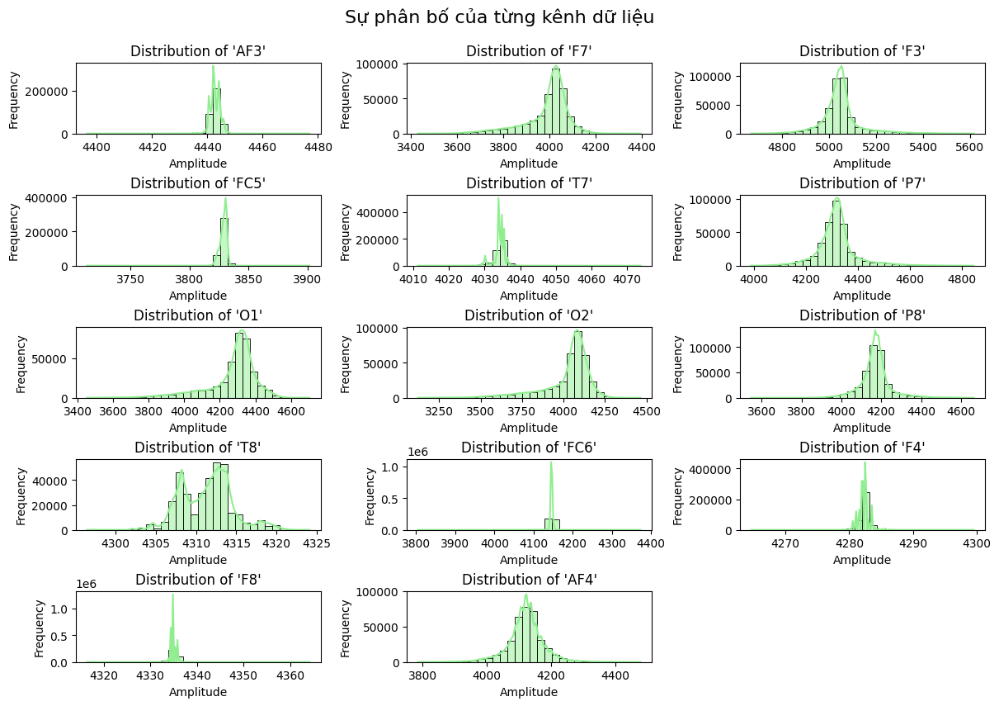

In [11]:

def plot_column_distributions(df, bins=30, figsize=(12, 8)):
    # Lọc các cột có kiểu dữ liệu số
    numeric_columns = df.select_dtypes(include=['number']).columns
    n_cols = 3  # Số cột trên mỗi hàng
    n_rows = (len(numeric_columns) + n_cols - 1) // n_cols  # Tính số hàng cần thiết

    # Tạo lưới subplot
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, constrained_layout=True)
    axes = axes.flatten()  # Chuyển các trục thành mảng 1D để dễ duyệt

    # Vẽ histogram cho mỗi cột
    for idx, col in enumerate(numeric_columns):
        sns.histplot(df[col].dropna(), kde=True, bins=bins, ax=axes[idx], color='lightgreen', line_kws={'color': 'darkblue'})
        axes[idx].set_title(f"Distribution of '{col}'", fontsize=12)
        axes[idx].set_xlabel("Amplitude")
        axes[idx].set_ylabel("Frequency")

    # Ẩn các ô không sử dụng (nếu số cột không chia hết cho n_cols)
    for idx in range(len(numeric_columns), len(axes)):
        axes[idx].axis('off')

    # Tiêu đề cho toàn bộ biểu đồ, điều chỉnh vị trí tiêu đề
    plt.suptitle("Sự phân bố của từng kênh dữ liệu", fontsize=16, y=1.05)  # Tiêu đề cao hơn một chút
    plt.show()

# Gọi hàm trực quan hóa phân phối dữ liệu subject_1, day_1
plot_column_distributions(data_1, bins=30, figsize=(12, 8))


#### Check for distribution of channels using correlation matrix

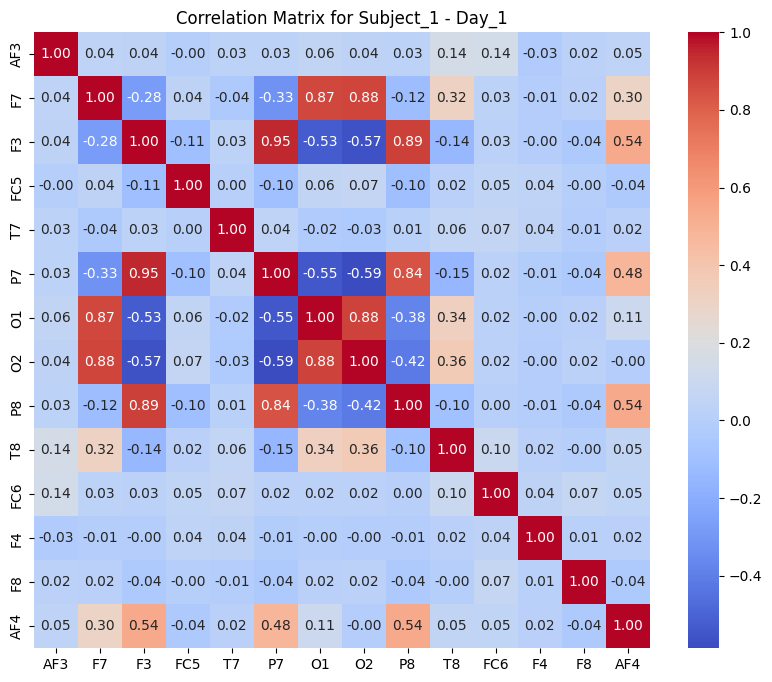

In [12]:
# Tính toán ma trận tương quan
correlation_matrix = data_1.corr()

# Vẽ heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, square=True)
plt.title("Correlation Matrix for Subject_1 - Day_1")
plt.show()

#### The position coordinates of sensors corresponding to EEG data channels

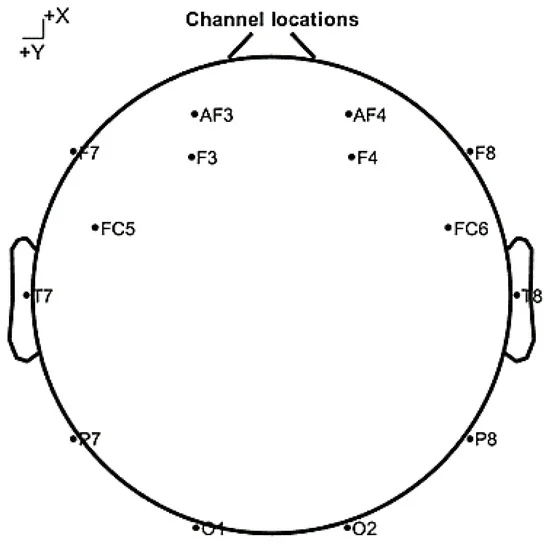

#### Evaluate important channels



In [13]:
import numpy as np

# Giả sử bạn có 5 DataFrame: data_1, data_2, data_3, data_4, data_5
data_list = [data_1, data_2, data_3, data_4, data_5]  # Danh sách các DataFrame


# Vòng lặp qua các DataFrame
for i, data in enumerate(data_list):
    # Tính phương sai của từng kênh
    variances = data.var()

    # Tìm ngưỡng 90% của phương sai
    threshold = np.percentile(variances, 90)

    # Chọn các kênh có phương sai lớn hơn ngưỡng
    selected_channels = variances[variances > threshold].index
    df_selected = data[selected_channels]

    # In danh sách các kênh có phương sai lớn hơn ngưỡng
    print(f"Các kênh có phương sai lớn hơn 90% của {[i+1]}:")
    print(selected_channels.tolist())


Các kênh có phương sai lớn hơn 90% của [1]:
['O1', 'O2']
Các kênh có phương sai lớn hơn 90% của [2]:
['F3', 'O1']
Các kênh có phương sai lớn hơn 90% của [3]:
['P8', 'AF4']
Các kênh có phương sai lớn hơn 90% của [4]:
['P7', 'AF4']
Các kênh có phương sai lớn hơn 90% của [5]:
['P7', 'O1']


Các kênh có phương sai lớn hơn 90% của [1]:
['O1', 'O2']


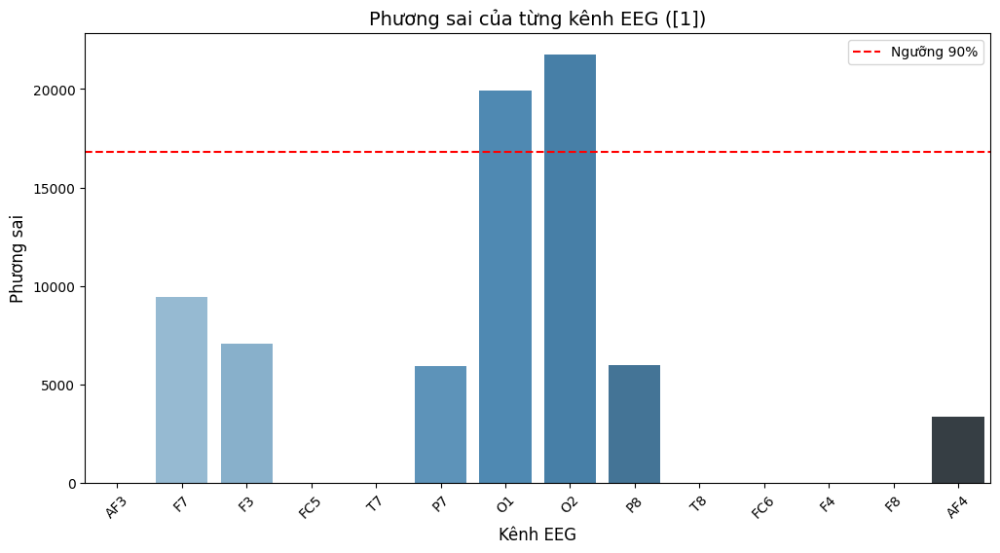

Các kênh có phương sai lớn hơn 90% của [2]:
['F3', 'O1']


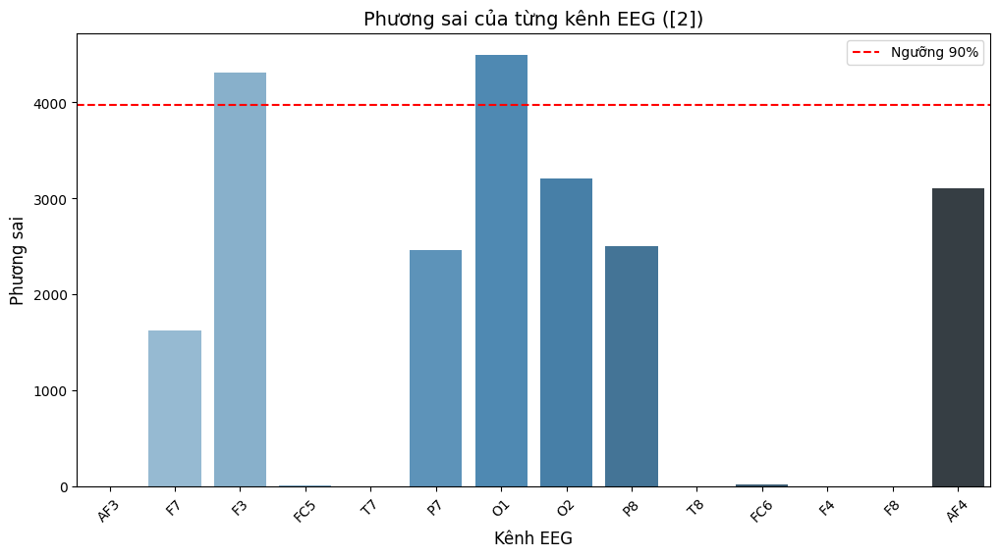

Các kênh có phương sai lớn hơn 90% của [3]:
['P8', 'AF4']


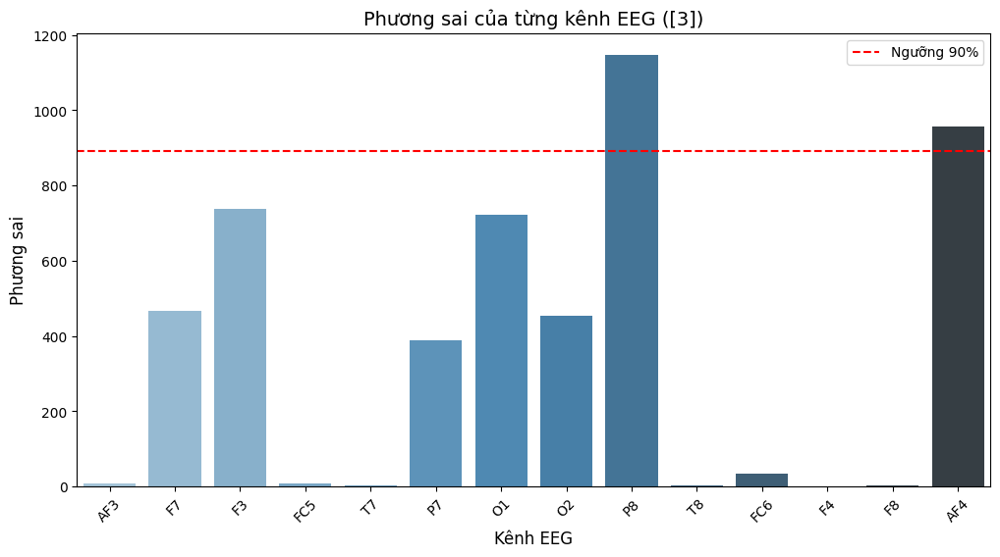

Các kênh có phương sai lớn hơn 90% của [4]:
['P7', 'AF4']


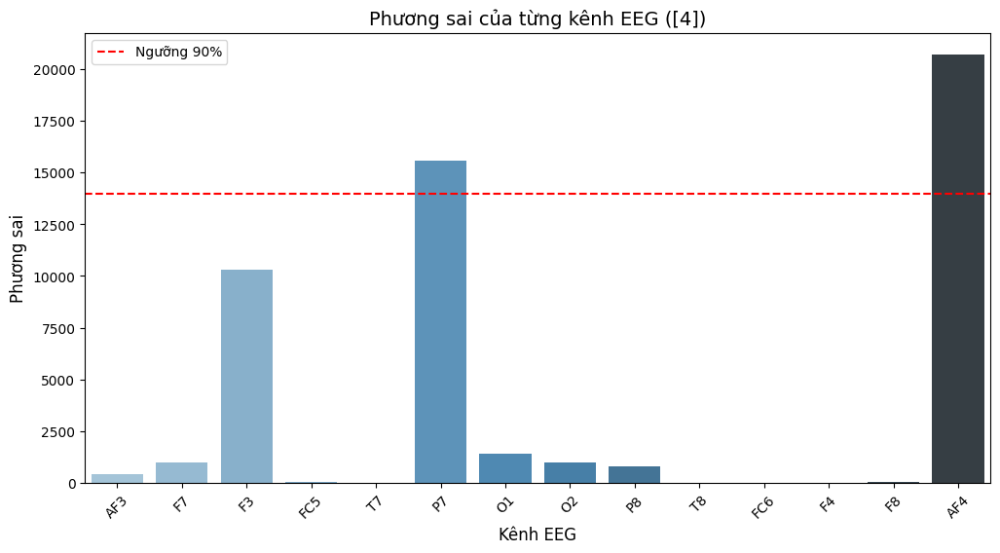

Các kênh có phương sai lớn hơn 90% của [5]:
['P7', 'O1']


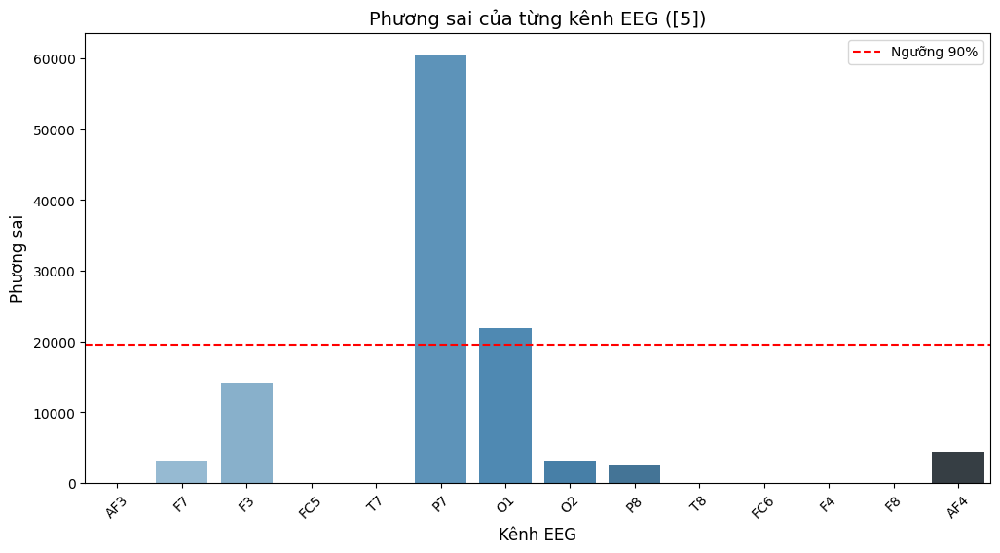

In [14]:
# Vòng lặp qua các DataFrame
for i, data in enumerate(data_list):
    # Tính phương sai của từng kênh
    variances = data.var()

    # Tìm ngưỡng 90% của phương sai
    threshold = np.percentile(variances, 90)

    # Chọn các kênh có phương sai lớn hơn ngưỡng
    selected_channels = variances[variances > threshold].index
    df_selected = data[selected_channels]

    # In danh sách các kênh có phương sai lớn hơn ngưỡng
    print(f"Các kênh có phương sai lớn hơn 90% của {[i+1]}:")
    print(selected_channels.tolist())

    # Trực quan hóa phương sai của tất cả các kênh
    plt.figure(figsize=(12, 6))
    sns.barplot(x=variances.index, y=variances.values, palette="Blues_d")
    plt.axhline(y=threshold, color='r', linestyle='--', label='Ngưỡng 90%')
    plt.xticks(rotation=45, fontsize=10)
    plt.ylabel('Phương sai', fontsize=12)
    plt.xlabel('Kênh EEG', fontsize=12)
    plt.title(f'Phương sai của từng kênh EEG ({[i+1]})', fontsize=14)
    plt.legend()
    plt.show()


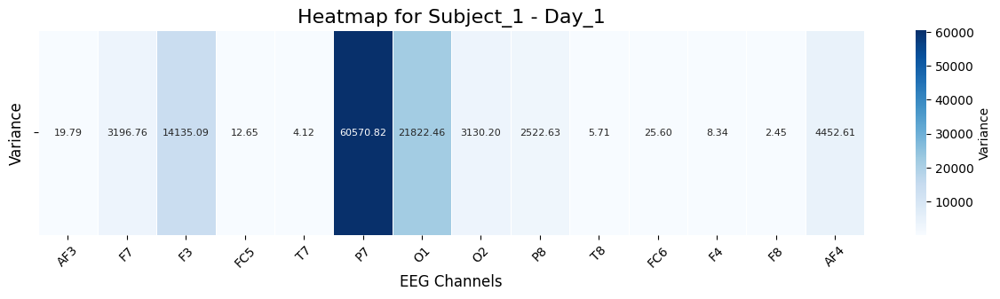

In [15]:
# Tạo ma trận phương sai cho heatmap
variance_matrix = variances.values.reshape(1, -1)  # Chuyển thành ma trận một dòng

# Vẽ heatmap
plt.figure(figsize=(15, 3))  # Điều chỉnh kích thước của heatmap cho phù hợp
sns.heatmap(variance_matrix, annot=True, cmap='Blues', xticklabels=variances.index,
            yticklabels=[""], cbar_kws={'label': 'Variance'}, linewidths=0.5,
            annot_kws={'size': 8}, fmt='.2f')

# Cài đặt các chi tiết hiển thị
plt.title('Heatmap for Subject_1 - Day_1', fontsize=16)
plt.xlabel('EEG Channels', fontsize=12)
plt.ylabel('Variance', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.show()

Ta thử lấy 1 người ra làm ví dụ để xem chỉ số Variance

*Ta* nhận thấy dữ liệu của 7 kênh: F7, F3, P7, O1, O2, P8, AF4 có variance rộng và có sự phân tán nên biên độ dao động sẽ có ảnh hưởng nhiều hơn so với những kênh còn lại. Mà theo như bài báo của tác giả có đề cập: "The acquired data from the 7 leads were identified by F3, F4, Fz, C3, C4, Cz, and Pz.". Hay 7 kênh mà tác giả muốn đề cập là F7, F3, P7, O1, O2, P8, AF4. Vậy nên ta sẽ chọn 7 kênh này và bỏ dữ liệu từ 7 kênh còn lại.

Thật vậy, khi xem xét lại Discussion của dataset trên kaggle thì tác giả có khẳng định về data:
- 2 kênh là để tham khảo
- 5 kênh vẫn có thu dữ liệu nhưng mà các thiết bị cảm biến của 5 kênh đó không được đặt trên đầu

### 1.3 DATA PREPROCESSING

In [16]:
# Danh sách các kênh cần trích xuất
useful_channels = np.array([1, 2, 5, 6, 7, 8, 13]) + 3

# Gọi hàm load dữ liệu
all_subject_data = load_subject_data(folder_path, subjects, useful_channels)

# Kiểm tra dữ liệu
for subject, trials in all_subject_data.items():
    print(f"{subject}:")
    for trial, data in trials.items():
        print(f"  {trial}: {data.shape}")

Subject_1:
  Day_1: (357224, 7)
  Day_2: (380344, 7)
  Day_3: (351204, 7)
  Day_4: (288752, 7)
  Day_5: (398816, 7)
Subject_2:
  Day_1: (381340, 7)
  Day_2: (391624, 7)
  Day_3: (356728, 7)
  Day_4: (373304, 7)
  Day_5: (345164, 7)
Subject_3:
  Day_1: (443972, 7)
  Day_2: (361840, 7)
  Day_3: (333236, 7)
  Day_4: (396812, 7)
  Day_5: (336280, 7)
Subject_4:
  Day_1: (360928, 7)
  Day_2: (415164, 7)
  Day_3: (363232, 7)
  Day_4: (347548, 7)
  Day_5: (214540, 7)
Subject_5:
  Day_1: (428848, 7)
  Day_2: (483732, 7)
  Day_3: (483376, 7)
  Day_4: (408976, 7)


#### Check and drop days whose experimental time less than 30 minutes

In [17]:
# Hàm kiểm tra xem có file nào ghi không đủ data không(thời gian nhỏ hơn 30 phút)
def check_days_with_insufficient_time(subject_data, freq_sample=128, min_time=30):
    result = {}

    for subject, days in subject_data.items():
        insufficient_days = []
        for day, data in days.items():
            samples = data.shape[0]
            time_in_minutes = samples / (freq_sample * 60)

            # Kiểm tra nếu không đủ thời gian
            if time_in_minutes < min_time:
                insufficient_days.append((day, time_in_minutes))

        if insufficient_days:
            result[subject] = insufficient_days
    return result


def drop_insufficient_days(subject_data, insufficient_days_result):
    updated_data = {}

    for subject, days in subject_data.items():
        # Lấy danh sách các ngày không đủ thời gian cho subject này
        insufficient_days = [day for day, _ in insufficient_days_result.get(subject, [])]

        # Lấy các ngày hợp lệ (không có trong insufficient_days)
        valid_days = {day: data for day, data in days.items() if day not in insufficient_days}

        # Cập nhật subject mới với các ngày hợp lệ
        updated_data[subject] = valid_days

    return updated_data

In [18]:
result = check_days_with_insufficient_time(all_subject_data)
print(result)

{'Subject_4': [('Day_5', 27.934895833333332)]}




Dữ liệu vào thứ 5 của người thứ 4 có số phút là 27.93 không đủ 30 phút nên ta bỏ

In [19]:
all_subject_data = drop_insufficient_days(all_subject_data, result)

Kết quả sau khi bỏ dữ liệu

In [20]:
# Kiểm tra dữ liệu
for subject, trials in all_subject_data.items():
    print(f"{subject}:")
    for trial, data in trials.items():
        print(f"  {trial}: {data.shape}")

Subject_1:
  Day_1: (357224, 7)
  Day_2: (380344, 7)
  Day_3: (351204, 7)
  Day_4: (288752, 7)
  Day_5: (398816, 7)
Subject_2:
  Day_1: (381340, 7)
  Day_2: (391624, 7)
  Day_3: (356728, 7)
  Day_4: (373304, 7)
  Day_5: (345164, 7)
Subject_3:
  Day_1: (443972, 7)
  Day_2: (361840, 7)
  Day_3: (333236, 7)
  Day_4: (396812, 7)
  Day_5: (336280, 7)
Subject_4:
  Day_1: (360928, 7)
  Day_2: (415164, 7)
  Day_3: (363232, 7)
  Day_4: (347548, 7)
Subject_5:
  Day_1: (428848, 7)
  Day_2: (483732, 7)
  Day_3: (483376, 7)
  Day_4: (408976, 7)


#### Filtering data using both band-pass and Notch

**Band-pass filter (Bộ lọc thông dải):** Bộ lọc thông dải cho phép tín hiệu trong một dải tần số cụ thể đi qua và chặn tín hiệu ở các tần số ngoài dải đó
. Ví dụ, một bộ lọc thông dải có thể được sử dụng để giữ lại tín hiệu trong khoảng từ 1 Hz đến 50 Hz, đồng thời loại bỏ tín hiệu ở tần số thấp hơn 1 Hz và cao hơn 50 Hz.

Bộ lọc này thường được sử dụng để loại bỏ các tần số không mong muốn nhưng vẫn giữ lại các tần số quan trọng.

**Notch filter (Bộ lọc hẹp):** Bộ lọc hẹp được thiết kế để loại bỏ tín hiệu ở một tần số duy nhất hoặc một dải tần số rất hẹp.

Một ví dụ phổ biến là loại bỏ tần số 50 Hz (hoặc 60 Hz tùy vào quốc gia) từ tín hiệu điện do nguồn điện lưới gây ra (tần số nhiễu).

Bộ lọc Notch "cắt" (hoặc làm suy giảm mạnh) tín hiệu ở tần số cụ thể mà không ảnh hưởng nhiều đến các tần số xung quanh.

**Lợi ích khi áp dụng vào model:**

Bộ lọc Notch tại 50Hz: Dữ liệu EEG thường bị nhiễu từ các nguồn điện lưới (tần số 50 Hz ở nhiều quốc gia). Việc áp dụng bộ lọc notch giúp loại bỏ nhiễu này mà không làm ảnh hưởng đến các tần số quan trọng trong dải tần của EEG.

Bộ lọc Band-pass (0.5Hz đến 40Hz): Bộ lọc này giúp loại bỏ các tần số rất thấp (có thể là nhiễu hoặc tín hiệu nền) và tần số cao (có thể là nhiễu từ các thiết bị khác hoặc tín hiệu không liên quan). Điều này giúp bảo tồn các tần số quan trọng của sóng não, ví dụ như sóng delta, theta, alpha, beta, và gamma, mà mô hình EEG cần để phân tích.

Lí do chọn:

+ Do tín hiệu EEG chứa sóng não phổ biến trong đoạn 0.5 tới 40.

+ Ví dụ: Delta (0.5 - 4 Hz), Theta (4 - 8 Hz), Alpha (8 - 13 Hz), Beta (13 - 30 Hz), Gamma (30 - 40 Hz)

+ Và thường trong môi trường thực tế, tín hiệu EEG thường bị nhiễu từ hệ thống điện lưới, đặc biệt là tại tần số 50 Hz (ở nhiều quốc gia) hoặc 60 Hz (ở các quốc gia khác). Nhiễu này xuất phát từ các thiết bị điện tử xung quanh, chẳng hạn như máy tính, đèn chiếu sáng, hoặc các thiết bị điện khác



In [21]:

def combined_filter(data, fs=128):
    """
    Áp dụng bộ lọc band-pass từ 0.5Hz đến 40Hz và bộ lọc Notch tại 50Hz.

    Parameters:
        data (ndarray): Dữ liệu EEG cần lọc.
        fs (int): Tần số lấy mẫu (Hz), mặc định là 128.

    Returns:
        ndarray: Dữ liệu đã được lọc.
    """
    nyquist = fs / 2
    low = 0.5 / nyquist
    high = 40 / nyquist
    b_band, a_band = butter(6, [low, high], btype='band')

    # Thiết kế bộ lọc Notch tại 50Hz
    notch_freq = 50  # tần số nguồn điện
    quality_factor = 10  # độ rộng của bộ lọc
    b_notch, a_notch = iirnotch(notch_freq, quality_factor, fs)

    # Áp dụng bộ lọc band-pass
    bandpass_filtered = filtfilt(b_band, a_band, data)

    # Áp dụng bộ lọc Notch
    filtered_signal = filtfilt(b_notch, a_notch, bandpass_filtered)

    return filtered_signal

def filter_subject_data(subject_data, fs=128):
    """
    Lọc dữ liệu cho tất cả các đối tượng và các ngày thí nghiệm.

    Parameters:
        subject_data (dict): Dữ liệu của các đối tượng và các lần thí nghiệm.
        fs (int): Tần số lấy mẫu (Hz), mặc định là 128.

    Returns:
        dict: Dữ liệu đã lọc cho các đối tượng.
    """
    filtered_data = {}

    # Duyệt qua tất cả các đối tượng
    for subject_name, trials in subject_data.items():
        subject_filtered = {}

        # Duyệt qua các ngày thí nghiệm của đối tượng
        for trial_name, data in trials.items():
            # Lọc dữ liệu của từng ngày thí nghiệm
            subject_filtered[trial_name] = np.apply_along_axis(combined_filter, axis=0, arr=data, fs=fs)

        # Lưu dữ liệu đã lọc của đối tượng
        filtered_data[subject_name] = subject_filtered

    return filtered_data

# Áp dụng lọc dữ liệu cho các đối tượng
filtered_all_subject_data = filter_subject_data(all_subject_data, fs=128)

In [22]:
filtered_all_subject_data['Subject_1']['Day_1'].shape

(357224, 7)

In [23]:
# Tên của kênh là tên của cột
channel_names = useful_channels

In [24]:
def analyze_data(all_subject_data, filtered_all_subject_data, num_subjects=2, num_days=1, fs=128):
    """
    Vẽ biểu đồ tín hiệu EEG trước và sau khi lọc cho các đối tượng trong từng ngày thí nghiệm.

    Parameters:
    - all_subject_data: Dữ liệu thô của tất cả các đối tượng
    - filtered_all_subject_data: Dữ liệu đã lọc của tất cả các đối tượng
    - num_subjects: Số lượng đối tượng cần phân tích (mặc định là 2)
    - num_days: Số lượng ngày thí nghiệm cần phân tích (mặc định là 1)
    - fs: Tần số lấy mẫu
    """
    subjects = list(all_subject_data.keys())[:num_subjects]  # Lấy một số đối tượng cần phân tích

    for subject in subjects:
        subject_data = all_subject_data[subject]
        subject_filtered_data = filtered_all_subject_data[subject]

        # Duyệt qua các ngày thí nghiệm
        days = list(subject_data.keys())[:num_days]  # Lấy số ngày cần phân tích
        for day in days:
            raw_data = subject_data[day]
            filtered_data = subject_filtered_data[day]

            # Vẽ biểu đồ tín hiệu gốc
            plt.figure(figsize=(15, 10))
            plt.subplot(2, 1, 1)
            plt.plot(raw_data[:500, :])  # Vẽ 500 mẫu đầu tiên của dữ liệu
            plt.title(f"Raw EEG Data - {subject} - {day}")
            plt.xlabel("Sample")
            plt.ylabel("Amplitude")
            plt.legend(channel_names)
            plt.grid(True)

            # Vẽ biểu đồ tín hiệu đã lọc
            plt.subplot(2, 1, 2)
            plt.plot(filtered_data[:500, :])  # Vẽ 500 mẫu đầu tiên của dữ liệu đã lọc
            plt.title(f"Filtered EEG Data - {subject} - {day}")
            plt.xlabel("Sample")
            plt.ylabel("Amplitude")
            plt.legend(channel_names)
            plt.grid(True)

            plt.tight_layout()
            plt.show()



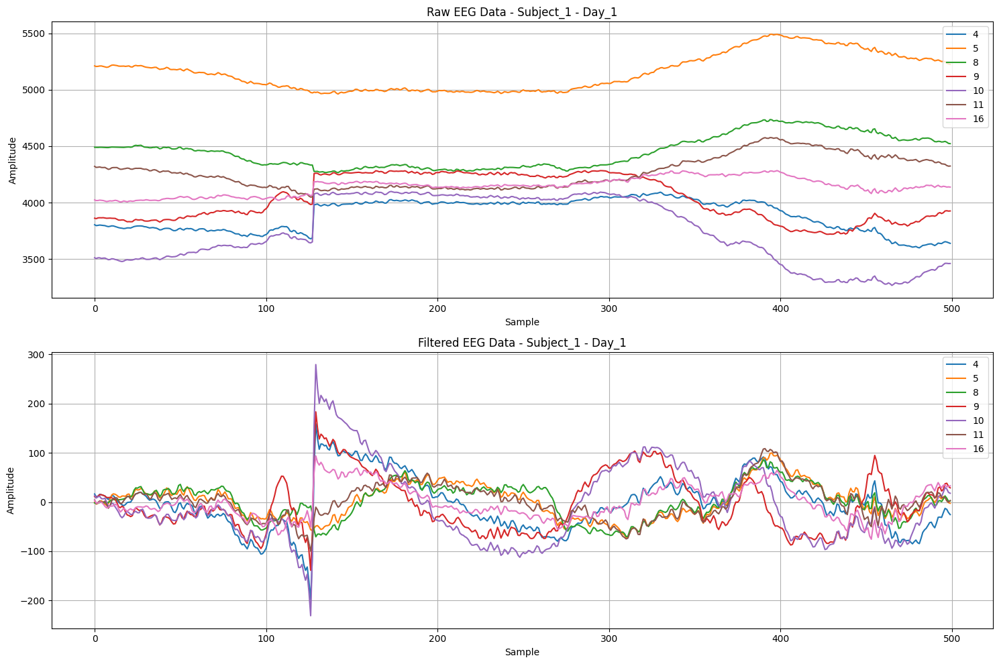

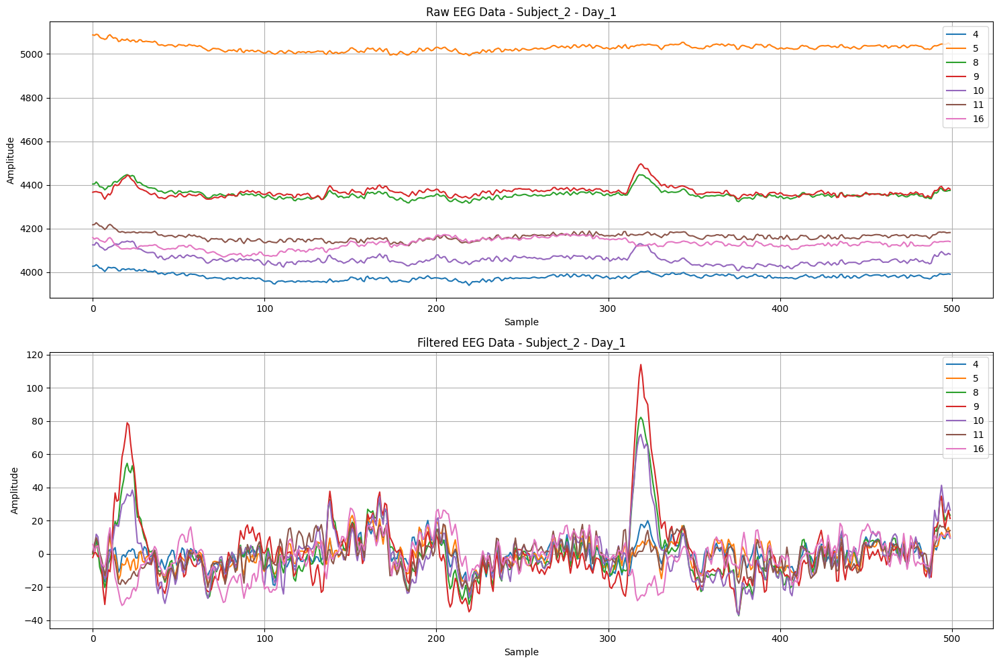

In [25]:
# Áp dụng phân tích và vẽ biểu đồ cho các đối tượng và các ngày thí nghiệm
analyze_data(all_subject_data, filtered_all_subject_data, num_subjects=2, num_days=1, fs=128)

Từ ảnh ta cũng dễ dàng nhận thấy dữ liệu sau khi được lọc nhiễu từ các dải tần số nhỏ hơn 0.5Hz và lớn hơn 40Hz kết hợp bộ lọc Notch thì dữ liệu đã đã có thể quan sát dễ dàng hơn các dao động từ các dải tần số trong khoảng từ 0-40Hz

#### Apply ICA

#####What is ICA?



ICA (Independent Component Analysis) là một phương pháp phân tích tín hiệu, được sử dụng để tách các thành phần độc lập trong một tập hợp tín hiệu hỗn hợp. Nó là một kỹ thuật thống kê trong học máy và xử lý tín hiệu, thường được sử dụng trong các ứng dụng như phân tích dữ liệu, nhận dạng mẫu, và xử lý tín hiệu.

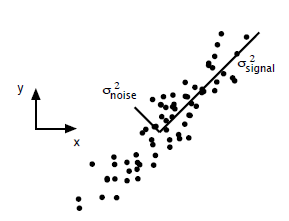

ICA (Independent Component Analysis) trong phân tích EEG giúp tách các nguồn tín hiệu độc lập, loại bỏ nhiễu và artefacts (như cử động cơ thể hoặc điện tử), và cải thiện chất lượng tín hiệu. Điều này giúp phân tích rõ hơn hoạt động não bộ, nhận diện các trạng thái nhận thức khác nhau (như tập trung, buồn ngủ), và hỗ trợ trong nghiên cứu lâm sàng, chẳng hạn như phát hiện rối loạn thần kinh.

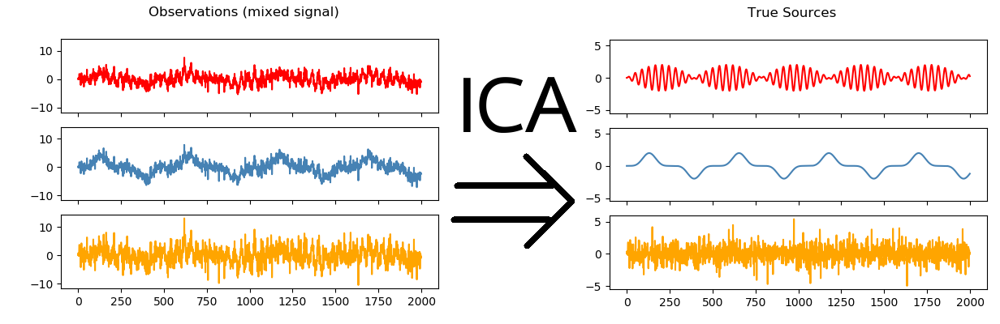

#####Mathematical definitions



**Phân tích Thành phần Độc Lập (ICA)** là một kỹ thuật thống kê nhằm tìm kiếm các thành phần độc lập ẩn dưới một tập hợp các tín hiệu quan sát. Mô hình toán học cơ bản của ICA được biểu diễn như sau:

Công thức toán học cơ bản của Independent Component Analysis (ICA) là:
\begin{align*}
\mathbf{X} &= \mathbf{S} \mathbf{A}
\end{align*}

Trong đó:
* **X:** Ma trận dữ liệu quan sát, mỗi hàng là một quan sát, mỗi cột là một kênh tín hiệu.
* **S:** Ma trận chứa các thành phần độc lập, mỗi hàng là một nguồn tín hiệu độc lập.
* **A:** Ma trận hỗn hợp, thể hiện mối quan hệ tuyến tính giữa các nguồn độc lập và tín hiệu quan sát.
* **W:** Ma trận phân tách, được tìm kiếm để tách các nguồn độc lập từ tín hiệu quan sát.

Mục tiêu của ICA là tìm ma trận W sao cho các thành phần trong S là độc lập nhất có thể.
\begin{align*}
\mathbf{S} &= \mathbf{W} \mathbf{X}
\end{align*}

**Quá trình thực hiện ICA:**
1. Thu thập tín hiệu quan sát **X**.
2. Áp dụng ICA để tìm ma trận phân tách **W**.
3. Tách các nguồn tín hiệu độc lập **S** từ tín hiệu quan sát.


**Công dụng của ICA cho dữ liệu EEG**

ICA giúp lọc ra các tín hiệu EOG và ECG, giúp loại bỏ các tín hiệu như nháy mắt, nhịp tim làm cho mô hình tối ưu nhất có thể





In [26]:
#đặt tên các kênh chanels
channel_names = [ 'F7' , 'F3' , 'P7' , 'O1' , 'O2' , 'P8' , 'AF4' ]

In [27]:
def apply_ica(filtered_all_subject_data, channel_names):
    ica_list = {}  # Lưu ICA cho từng đối tượng
    raw_list = {}  # Lưu Raw cho từng đối tượng

    # Duyệt qua từng đối tượng trong all_subject_data
    for subject_name, subject_data in filtered_all_subject_data.items():
        ica_list[subject_name] = []
        raw_list[subject_name] = []

        # Duyệt qua các ngày thí nghiệm của từng đối tượng
        for day, data_one_day in subject_data.items():
            sfreq = 128
            info = mne.create_info(ch_names=channel_names, sfreq=sfreq, ch_types='eeg')
            filtered_data_mne = data_one_day.T

            # Tạo đối tượng Raw từ dữ liệu
            raw = mne.io.RawArray(filtered_data_mne, info)

            # Thêm montage(vị tri điện cực chuẩn) vào đối tượng Raw với montage 'standard_1020'
            montage = mne.channels.make_standard_montage('standard_1020')
            raw.set_montage(montage)

            # Áp dụng ICA để tách các thành phần độc lập
            ica = ICA(n_components=7, random_state=42, max_iter='auto')
            ica.fit(raw)

            ica_list[subject_name].append(ica)
            raw_list[subject_name].append(raw)

    return ica_list, raw_list

# Giả sử filtered_all_subject_data là dữ liệu đã lọc của tất cả các đối tượng
ica_list, raw_list = apply_ica(filtered_all_subject_data, channel_names)


Creating RawArray with float64 data, n_channels=7, n_times=357224
    Range : 0 ... 357223 =      0.000 ...  2790.805 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may take a while)
Selecting by number: 7 components
Fitting ICA took 4.3s.
Creating RawArray with float64 data, n_channels=7, n_times=380344
    Range : 0 ... 380343 =      0.000 ...  2971.430 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may take a while)
Selecting by number: 7 components
Fitting ICA took 6.8s.
Creating RawArray with float64 data, n_channels=7, n_times=351204
    Range : 0 ... 351203 =      0.000 ...  2743.773 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may take a while)
Selecting by number: 7 components
Fitting ICA took 6.2s.
Creating RawArray with float64 data, n_channels=7, n_times=288752
    Range : 0 ... 288751 =      0.000 ...  2255.867 secs
Ready.
Fitting ICA to data using 7 channels (please be patient, this may tak

In [28]:
# Thông tin ngày thứ 3 của đối tượng 1 trong danh sách raw
raw_list['Subject_1'][2].info

<Info | 8 non-empty values
 bads: []
 ch_names: F7, F3, P7, O1, O2, P8, AF4
 chs: 7 EEG
 custom_ref_applied: False
 dig: 10 items (3 Cardinal, 7 EEG)
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 7
 projs: []
 sfreq: 128.0 Hz
>

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 16.000 (s)
Plotting power spectral density (dB=True).


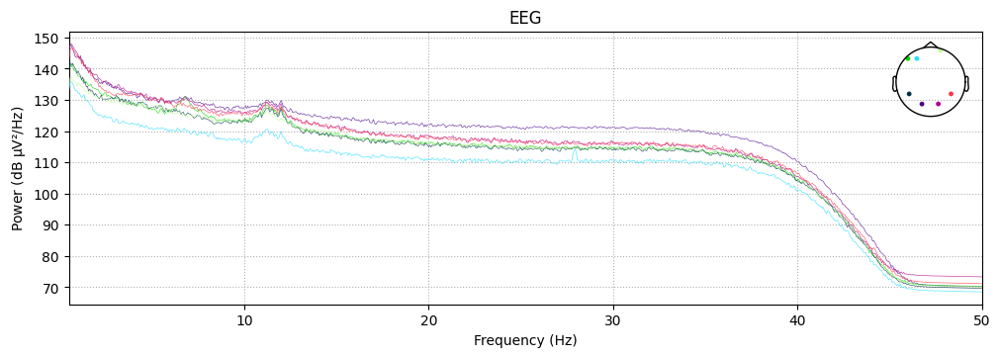

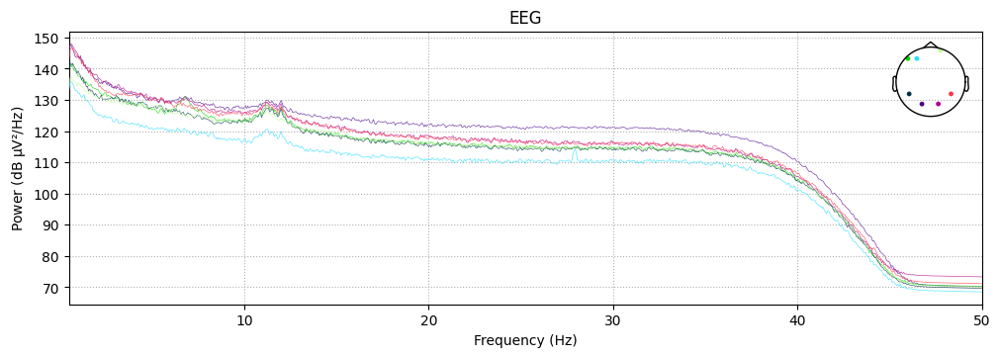

In [29]:
# Vẽ biểu đồ mật độ phổ công suất (Power Spectral Density)
raw_list['Subject_1'][2].plot_psd(fmin=0.5, fmax=50, average=False)

Nhận xét: các đường có xu hướng giảm dần khi tần số tăng, cho thấy năng lượng của tín hiệu tập trung nhiều hơn ở các tần số thấp và giảm mạnh ở tần số cao.

+ Năng lượng cao nhất nằm trong khoảng từ 0 đến 10 Hz, tương ứng với các dải sóng delta (0.5-4 Hz) và theta (4-8 Hz).

+ Từ 10 Hz đến khoảng 40 Hz, năng lượng giảm dần và có xu hướng ổn định.

+ Sau 40 Hz, năng lượng giảm mạnh, cho thấy đã có sự lọc bỏ các tần số cao hơn 40 Hz.

Một đường thẳng đứng có thể ám chỉ sự cắt tần số tại 40 Hz, thể hiện việc áp dụng bộ lọc band-pass.

In [30]:
ica_list['Subject_1'][1]

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,35 iterations on raw data (380344 samples)
ICA components,7
Available PCA components,7
Channel types,eeg
ICA components marked for exclusion,—


##### Visualize ICA components and source signals from a subject in time

In [31]:
def plot_ica_components_and_sources(subject_name, start_day, end_day, ica_list, raw_list):
    """
    Vẽ các thành phần ICA và tín hiệu nguồn cho một đối tượng (subject) cụ thể trong một khoảng thời gian (start_day đến end_day).

    Parameters:
    - subject_name: str, tên của đối tượng cần vẽ.
    - start_day: int, ngày bắt đầu (chỉ số ngày, bắt đầu từ 0).
    - end_day: int, ngày kết thúc (chỉ số ngày, bắt đầu từ 0).
    - ica_list: dict, danh sách các đối tượng ICA theo từng subject.
    - raw_list: dict, danh sách các đối tượng Raw theo từng subject.
    """
    # Kiểm tra xem subject_name có tồn tại trong ica_list và raw_list không
    if subject_name not in ica_list or subject_name not in raw_list:
        print(f"Subject {subject_name} không tồn tại trong danh sách ICA hoặc Raw.")
        return

    # Lặp qua các ngày trong khoảng start_day đến end_day
    for day_idx in range(start_day, end_day + 1):
        ica = ica_list[subject_name][day_idx]
        raw = raw_list[subject_name][day_idx]

        print(f"Subject {subject_name}, Day {day_idx + 1}")

        # Vẽ tín hiệu nguồn
        ica.plot_sources(raw, start=0, stop=20)

        # Vẽ các thành phần ICA
        ica.plot_components(outlines='head')

Subject Subject_1, Day 1
Creating RawArray with float64 data, n_channels=7, n_times=357224
    Range : 0 ... 357223 =      0.000 ...  2790.805 secs
Ready.
Using matplotlib as 2D backend.


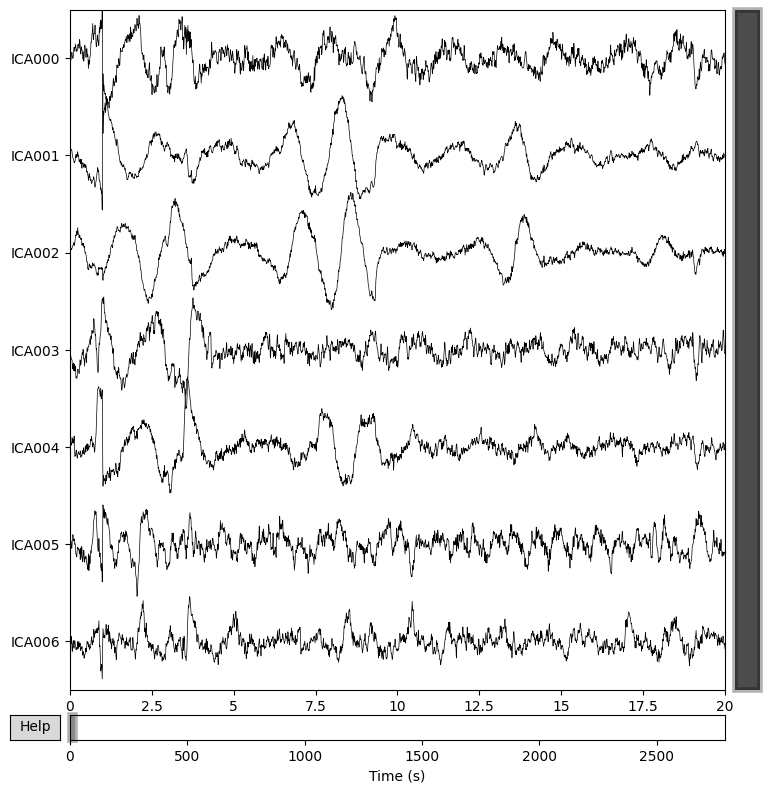

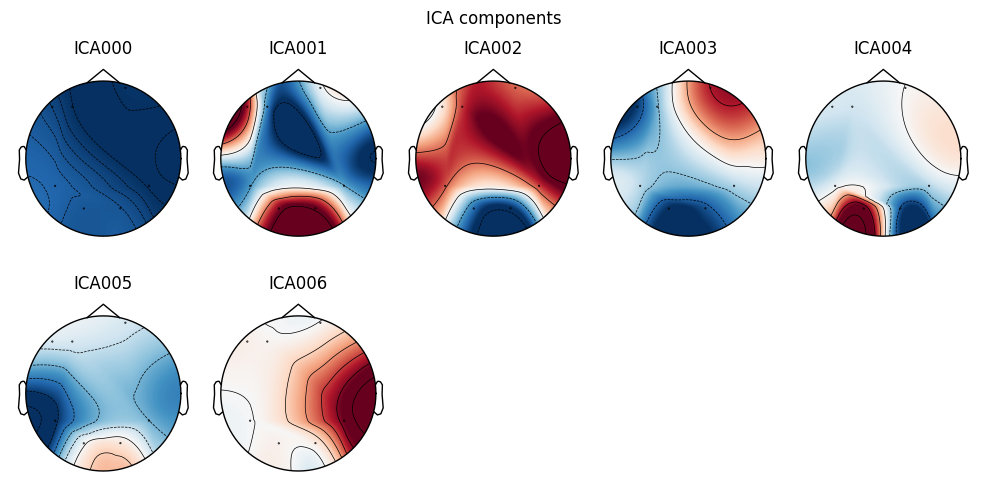

Subject Subject_1, Day 2
Creating RawArray with float64 data, n_channels=7, n_times=380344
    Range : 0 ... 380343 =      0.000 ...  2971.430 secs
Ready.


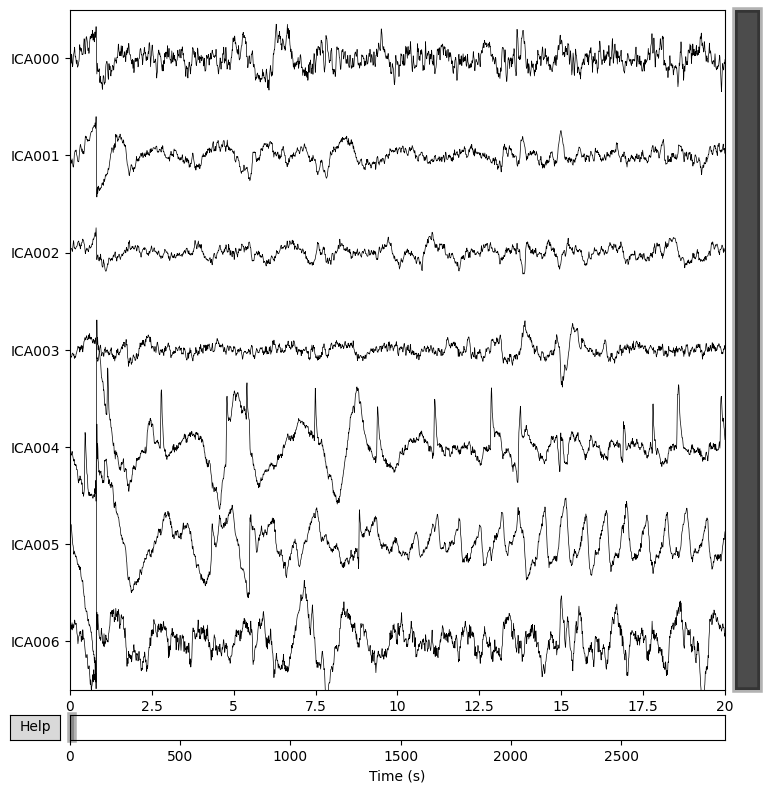

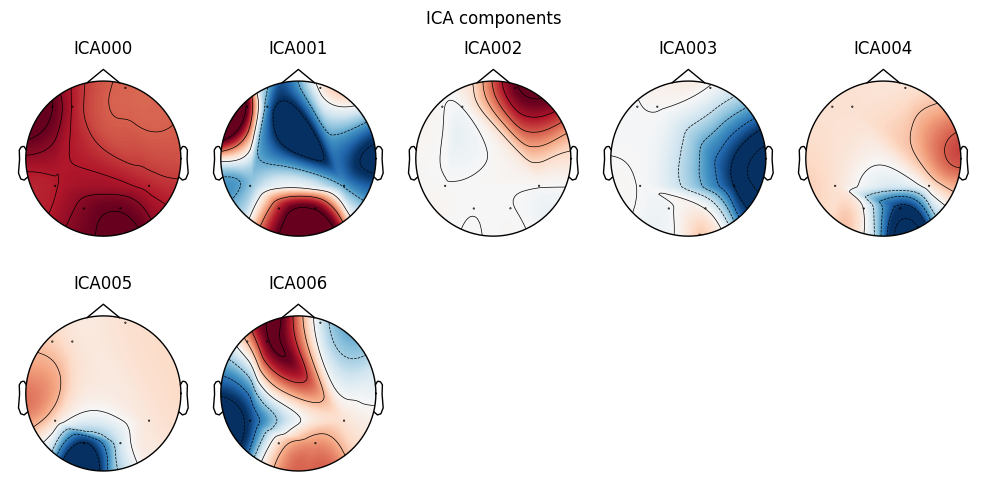

Subject Subject_1, Day 3
Creating RawArray with float64 data, n_channels=7, n_times=351204
    Range : 0 ... 351203 =      0.000 ...  2743.773 secs
Ready.


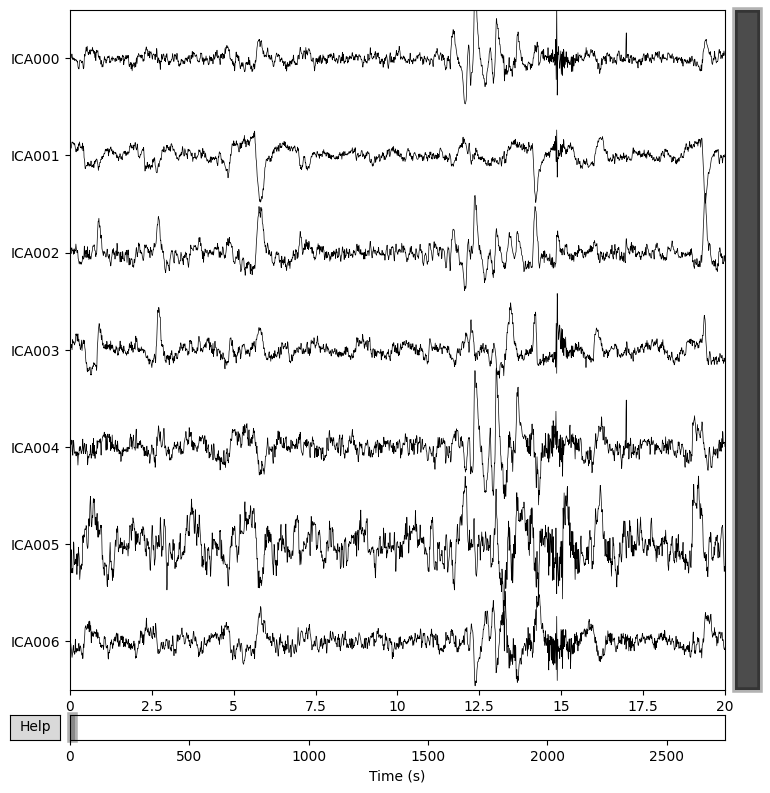

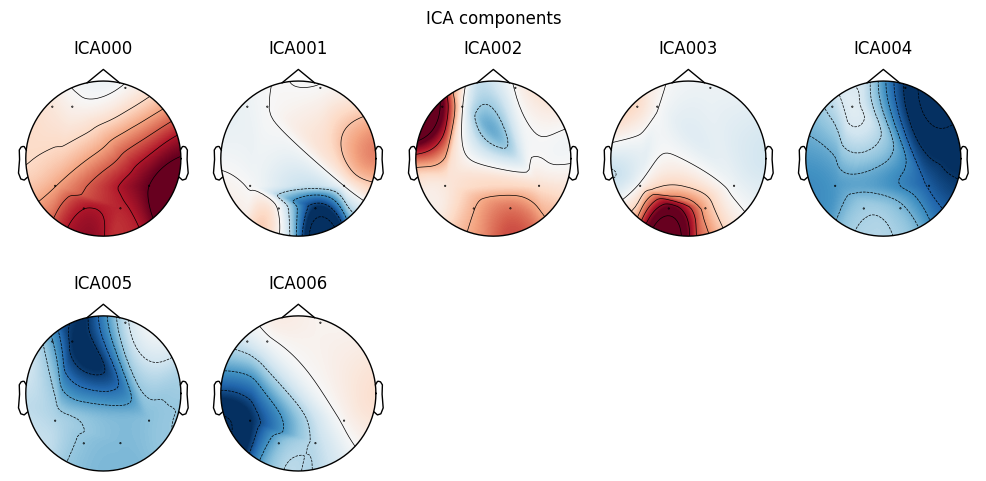

In [32]:
# Vẽ cho Subject_1 từ ngày 1 đến ngày 3
plot_ica_components_and_sources('Subject_1', 0, 2, ica_list, raw_list)

##### Create EOG epochs and plot

In [33]:
eye_channels = ['F7', 'F3', 'AF4']  # Kênh EOG
heart_channels = ['P7', 'P8', 'O1', 'O2']  # Kênh ECG

Using EOG channels: F7, F3, AF4
EOG channel index for this subject is: [0 1 6]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel F7 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 3 significant peaks
Number of EOG events detected: 3
Not setting metadata
3 matching events found
No baseline correction applied
Using data from preloaded Raw for 3 events and 129 original time points ...
0 bad epochs dropped
Applying baseline correcti

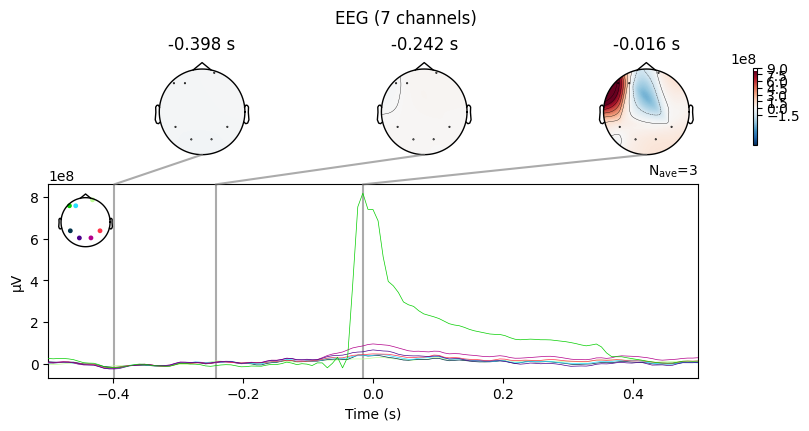

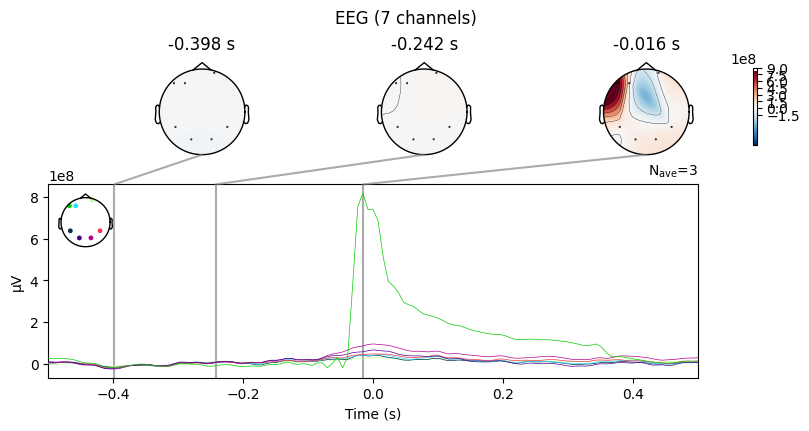

In [34]:
# Chọn đối tượng và ngày thí nghiệm
subject = 'Subject_1'
day = 1

# Lấy đối tượng raw tương ứng
raw = raw_list[subject][day]

# Tạo EOG epochs and plot
eog_evoked = create_eog_epochs(raw, ch_name=eye_channels).average()
eog_evoked.apply_baseline(baseline=(None, -0.2))
eog_evoked.plot_joint()

##### Detect EOG and ECG noise components

In [35]:
eye_channels = ['F7', 'AF4']  # Kênh EOG
heart_channels = ['P7']  # Kênh ECG
threshold_ecg = 0.5  # Define the threshold for ECG

def detect_noisy_components(ica_list, raw_list, threshold_eog=3.0, threshold_ecg=0.5):
    exclude_components_dict = {}

    for subject, ica_subject in ica_list.items():
        exclude_components_dict[subject] = {}
        for day_idx, ica in enumerate(ica_subject):
            raw = raw_list[subject][day_idx]

            # Phát hiện các thành phần liên quan đến EOG
            eog_indices, _ = ica.find_bads_eog(raw, threshold=threshold_eog, ch_name=eye_channels)
            print(f"Subject {subject}, Day {day_idx + 1} - EOG components: {eog_indices}")

            # Phát hiện các thành phần liên quan đến ECG
            ecg_indices = []
            for heart_channel in heart_channels:
                if heart_channel in raw.info['ch_names']:
                    ecg_idx, _ = ica.find_bads_ecg(raw, threshold=threshold_ecg, ch_name=heart_channel)
                    ecg_indices.extend(ecg_idx)
            ecg_indices = list(set(ecg_indices))  # Loại bỏ trùng lặp
            print(f"Subject {subject}, Day {day_idx + 1} - ECG components: {ecg_indices}")

            # Gộp các thành phần bị loại bỏ (EOG + ECG)
            exclude_indices = list(set(eog_indices + ecg_indices))
            exclude_components_dict[subject][day_idx] = exclude_indices

            # Đánh dấu các thành phần bị loại bỏ
            ica.exclude = exclude_indices

    return exclude_components_dict


In [36]:
# Phát hiện các thành phần gây nhiễu
exclude_components_dict = detect_noisy_components(ica_list, raw_list)

Using EOG channels: F7, AF4
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 H

##### Clean EOG and ECG components

In [37]:
def apply_ica_and_clean_data(ica_list, raw_list, exclude_components_dict):
    cleaned_raw_list = {}

    for subject, ica_subject in ica_list.items():
        cleaned_raw_list[subject] = []
        for day_idx, ica in enumerate(ica_subject):
            raw = raw_list[subject][day_idx]

            # Lấy danh sách các thành phần cần loại bỏ từ exclude_components_dict
            exclude_components = exclude_components_dict[subject].get(day_idx, [])

            # Đánh dấu các thành phần nhiễu để loại bỏ
            ica.exclude = exclude_components

            # Áp dụng ICA để loại bỏ các thành phần nhiễu
            raw_cleaned = ica.apply(raw.copy())

            cleaned_raw_list[subject].append(raw_cleaned)

    return cleaned_raw_list


In [38]:
# Loại bỏ thành phần gây nhiễu
cleaned_raw_list = apply_ica_and_clean_data(ica_list, raw_list, exclude_components_dict)

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA comp

In [39]:
cleaned_raw_list['Subject_1']

[<RawArray | 7 x 357224 (2790.8 s), ~19.1 MB, data loaded>,
 <RawArray | 7 x 380344 (2971.4 s), ~20.3 MB, data loaded>,
 <RawArray | 7 x 351204 (2743.8 s), ~18.8 MB, data loaded>,
 <RawArray | 7 x 288752 (2255.9 s), ~15.4 MB, data loaded>,
 <RawArray | 7 x 398816 (3115.7 s), ~21.3 MB, data loaded>]

##### Save cleaned data as eeg_data_ica_filterd

In [40]:
def store_cleaned_data_as_filtered_dict(cleaned_raw_list):
    """
    Lưu dữ liệu đã làm sạch vào dict mới với cấu trúc filtered_all_subject_data.

    Parameters:
    - cleaned_raw_list: dict, danh sách các đối tượng Raw sau khi đã loại bỏ nhiễu.

    Returns:
    - filtered_all_subject_data: dict, cấu trúc dữ liệu sạch theo subject và ngày.
    """
    eeg_data_ica_filterd = {}

    for subject, raw_subject in cleaned_raw_list.items():
        eeg_data_ica_filterd[subject] = {}

        for day_idx, raw_data in enumerate(raw_subject):
            day_key = f"Day_{day_idx + 1}"
            data_array = raw_data.get_data()
            eeg_data_ica_filterd[subject][day_key] = data_array

    return eeg_data_ica_filterd

# Lưu dữ liệu sạch vào dict mới
eeg_data_ica_filterd = store_cleaned_data_as_filtered_dict(cleaned_raw_list)

In [41]:
#kiểm tra chiều dữ của 1 người tại 1 ngày nhất định
eeg_data_ica_filterd['Subject_1']['Day_2'].shape

(7, 380344)

### Divide EEG data into 3 states: focus, unfocus, drowsy

In [42]:
def split_data_by_state(subject_data, focus_duration=10, unfocus_duration=10, sfreq=128):
    focus_samples = focus_duration * 60 * sfreq  # Số mẫu trong 10 phút
    unfocus_samples = unfocus_duration * 60 * sfreq  # Số mẫu trong 10 phút

    split_data = {'focus': {}, 'unfocus': {}, 'drowsy': {}}

    for subject, days_data in subject_data.items():
        split_data['focus'][subject] = {}
        split_data['unfocus'][subject] = {}
        split_data['drowsy'][subject] = {}

        for day, data in days_data.items():
            # Dữ liệu có kích thước (num_channels, num_samples)
            # focus_data lấy từ mẫu 0 -> focus_samples
            focus_data = data[:, :focus_samples]
            # unfocus_data lấy từ focus_samples -> focus_samples*2
            unfocus_data = data[:, focus_samples:focus_samples + unfocus_samples]
            # drowsy_data lấy từ focus_samples*2 -> focus_samples*3
            drowsy_data = data[:, focus_samples + unfocus_samples:focus_samples + 2 * unfocus_samples]

            # Lưu dữ liệu của mỗi trạng thái cho từng ngày
            split_data['focus'][subject][day] = focus_data
            split_data['unfocus'][subject][day] = unfocus_data
            split_data['drowsy'][subject][day] = drowsy_data

    return split_data

data_split = split_data_by_state(eeg_data_ica_filterd, focus_duration=10, unfocus_duration=10, sfreq=128)

In [43]:
#kiểm tra
data_split['focus']['Subject_1']['Day_1'].shape

(7, 76800)

### Compare the energy of the frequency bands between two states of a subject.

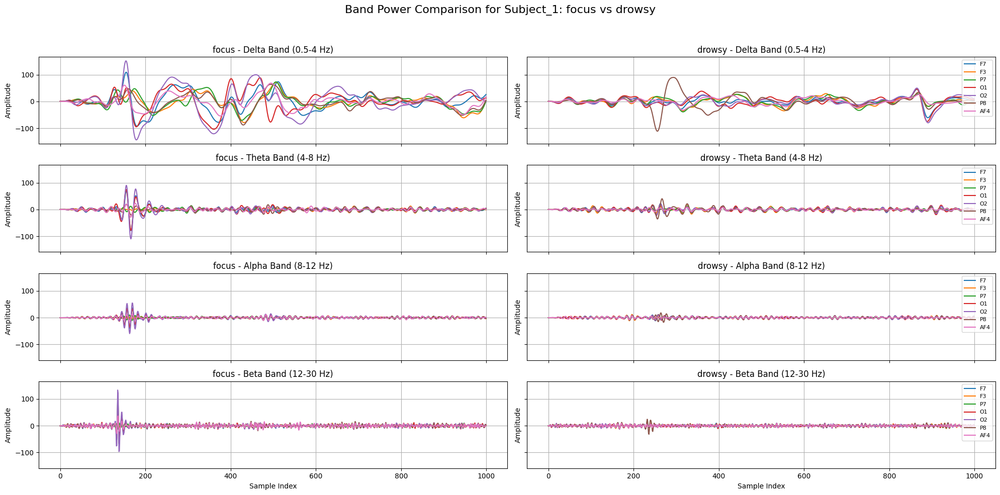

In [44]:
def bandpass_filter(data, sfreq, low, high, order=5):
    nyquist = 0.5 * sfreq
    low = low / nyquist
    high = high / nyquist
    b, a = butter(order, [low, high], btype='band')
    return lfilter(b, a, data, axis=1)  # Chỉnh sửa axis=1 để áp dụng bộ lọc theo chiều mẫu (columns)

def plot_comparison_band_power(data_split, sfreq, band_ranges, subject, states, sample_range):
    start, end = sample_range
    sample_steps = np.arange(start, end)  # Trục X là sample size
    fig, axs = plt.subplots(len(band_ranges), 2, figsize=(20, 10), sharex=True, sharey=True)
    fig.suptitle(f'Band Power Comparison for {subject}: {states[0]} vs {states[1]}', fontsize=16)

    for col, state in enumerate(states):
        data = data_split[state][subject]['Day_1'][:, start:end]  # Lấy dữ liệu theo trạng thái và sample range

        for row, (band, (low, high)) in enumerate(band_ranges.items()):
            # Lọc dữ liệu cho band hiện tại
            filtered_data = bandpass_filter(data, sfreq, low, high)

            # Vẽ dữ liệu cho mỗi channel
            for ch in range(filtered_data.shape[0]):  # Axis 0 là num_channels
                axs[row, col].plot(sample_steps, filtered_data[ch, :], label=channel_names[ch])

            axs[row, col].set_title(f'{state} - {band} Band ({low}-{high} Hz)', fontsize=12)
            axs[row, col].set_ylabel('Amplitude')
            axs[row, col].grid(True)
            if col == 1:
                axs[row, col].legend(fontsize=8)

    axs[-1, 0].set_xlabel('Sample Index')
    axs[-1, 1].set_xlabel('Sample Index')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Sử dụng hàm
band_ranges = {'Delta': (0.5, 4), 'Theta': (4, 8), 'Alpha': (8, 12), 'Beta': (12, 30)}
sfreq = 128  # Tần số lấy mẫu
sample_range = (0, 1000)  # Khoảng sample cần hiển thị

subject = 'Subject_1'
states = ['focus', 'drowsy']  # Hai trạng thái cần so sánh

plot_comparison_band_power(data_split, sfreq, band_ranges, subject, states, sample_range)


## 2.Features Engineering

###Extract frequency domain features


##### Introducing the Fourier transform

Fourier Transform (FT) là một phép biến đổi toán học dùng để chuyển đổi một tín hiệu từ miền thời gian (time domain) sang miền tần số (frequency domain). Ý tưởng chính của Fourier Transform là phân tích một tín hiệu phức tạp thành các thành phần sóng cơ bản (sin và cos) với các tần số khác nhau.

Trong thực tế, FT rất hữu ích trong các lĩnh vực như xử lý tín hiệu, âm thanh, hình ảnh và đặc biệt là phân tích dữ liệu EEG, giúp hiểu được các thành phần tần số của tín hiệu não.

Công thức toán học của FT:

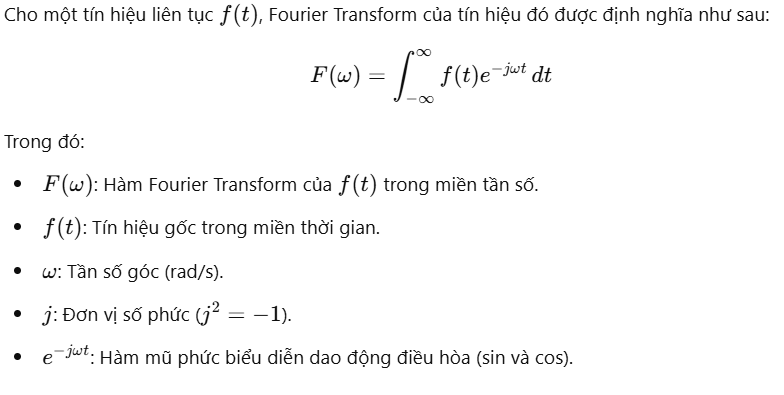



Sử dụng biến đổi Fourier bằng STFT

Trong quá trình xử lý tín hiệu EEG trong tập lệnh trên, Biến đổi Fourier được sử dụng để chuyển đổi tín hiệu từ miền thời gian sang miền tần số. Việc sử dụng biến đổi Fourier, cụ thể là Biến đổi Fourier ngắn hạn (STFT), mang lại nhiều lợi ích trong việc phân tích và trích xuất đặc trưng từ tín hiệu EEG.

Công thức toán học của STFT:


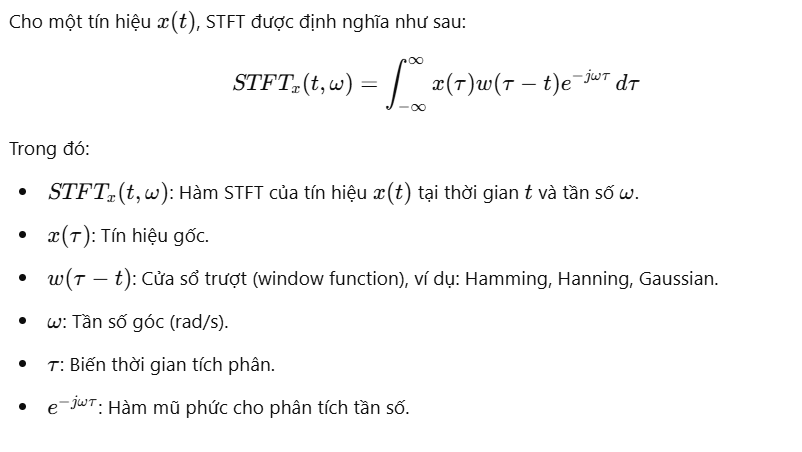


Lý do sử dụng Biến đổi Fourier trong xử lý tín hiệu EEG:

Phân tích thành phần tần số: Tín hiệu EEG là một dạng tín hiệu phức tạp, chứa đựng thông tin ở nhiều dải tần số khác nhau. Mỗi dải tần số tương ứng với các hoạt động não bộ cụ thể:

Delta (0.5 - 4 Hz): Liên quan đến giấc ngủ sâu.

Theta (4 - 8 Hz): Liên quan đến buồn ngủ, mơ mộng.

Alpha (8 - 12 Hz): Liên quan đến thư giãn, tỉnh táo.

Beta (12 - 30 Hz): Liên quan đến tập trung, hoạt động nhận thức.

Trích xuất đặc trưng hữu ích: Việc chuyển tín hiệu sang miền tần số cho phép trích xuất công suất tại các dải tần số quan trọng, giúp phân biệt các trạng thái não bộ khác nhau.

Hiểu rõ hơn về hoạt động não bộ: Phân tích tần số giúp xác định các mẫu sóng đặc trưng, hỗ trợ trong việc chẩn đoán và nghiên cứu khoa học.


In [45]:
data_split['focus']['Subject_1']['Day_2'].shape

(7, 76800)

In [46]:
import numpy as np
from scipy.signal import stft

def apply_stft_to_data_split(data_split, fs, window, nperseg, noverlap, nfft):
    power_result = {}

    for state, subjects_data in data_split.items():
        power_result[state] = {}
        for subject, days_data in subjects_data.items():
            n_channels, n_samples = next(iter(days_data.values())).shape  # Số kênh và số mẫu

            # Danh sách để lưu năng lượng phổ của từng kênh
            power_day_result = {}

            # Tính STFT cho từng kênh
            for day, data in days_data.items():
                power_day_list = []
                for ch in range(n_channels):
                    f, t, Zxx = stft(data[ch, :], fs=fs, window=window, nperseg=nperseg,
                                     noverlap=noverlap, nfft=nfft, detrend=False,
                                     return_onesided=True, boundary='zeros', padded=True)
                    power_day_list.append(np.abs(Zxx) ** 2)  # Năng lượng phổ

                # Lưu kết quả của mỗi ngày riêng biệt (không gộp lại thành mảng 4D)
                power_day_result[day] = np.stack(power_day_list, axis=0)  # (n_channels, nfft // 2 + 1, n_time_windows)

            # Lưu kết quả của từng subject cho từng trạng thái
            power_result[state][subject] = power_day_result

    return power_result


In [47]:
# Cấu hình thông số STFT

# Tần số mẫu (Hz)
fs = 128

# Số mẫu trong mỗi cửa sổ (1 giây)
nperseg = 128

# Không chồng lấn
noverlap = 0

 # Số điểm FFT
nfft = 1024

# Độ dài cửa sổ Blackman
M = nperseg

#số lượng cửa sổ
t_win = np.arange(0, M)

window_blackman = 0.42 - 0.5 * np.cos((2 * np.pi * t_win) / (M - 1)) + 0.08 * np.cos((4 * np.pi * t_win) / (M - 1))

# Áp dụng STFT cho dữ liệu
power_result = apply_stft_to_data_split(data_split, fs, window_blackman, nperseg, noverlap, nfft)


In [48]:
power_result['focus']['Subject_1']['Day_1'].shape

(7, 513, 601)

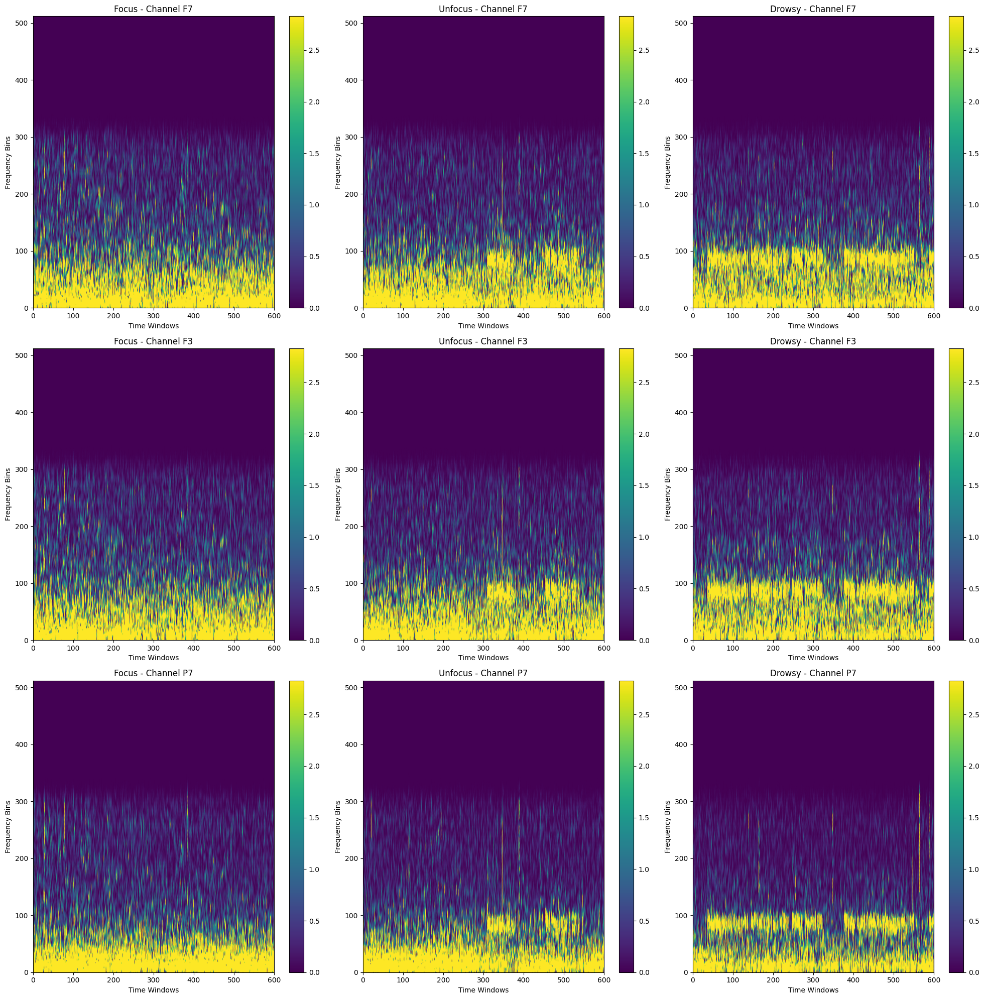

In [49]:
# Validate the power value for each channel in the 'focus' state for a specific subject
def compare_power_result(power_result, subject, day):
    states = ['focus', 'unfocus', 'drowsy']

    fig, axes = plt.subplots(3, len(states), figsize=(20, 20))

    for i, state in enumerate(states):
        power_data = power_result[state][subject][day]
        for j in range(3):
            ax = axes[j, i]
            im = ax.pcolormesh(power_data[j, :, :], vmin=0, vmax=2*np.sqrt(2), shading='gouraud')
            ax.set_title(f'{state.capitalize()} - Channel {channel_names[j]}')
            ax.set_xlabel('Time Windows')
            ax.set_ylabel('Frequency Bins')
            fig.colorbar(im, ax=ax)

    plt.tight_layout()
    plt.show()

# Example usage
compare_power_result(power_result, 'Subject_1', 'Day_1')

Ở các trạng thái thì tần số sóng não của ( tập trung > không tập trung > buồn ngủ ) nhưng ở PSD thì ngược lại ta nhìn hình phân bố có thể thấy dải năng lượng vàng phân bố ở trạng thái buồn ngủ là nhiều nhất tiếp đó là không tập trung cuối cùng là tập trung  

=> Tín hiệu PSD sẽ giảm ở các tần số cao và tăng ở các tần số thấp




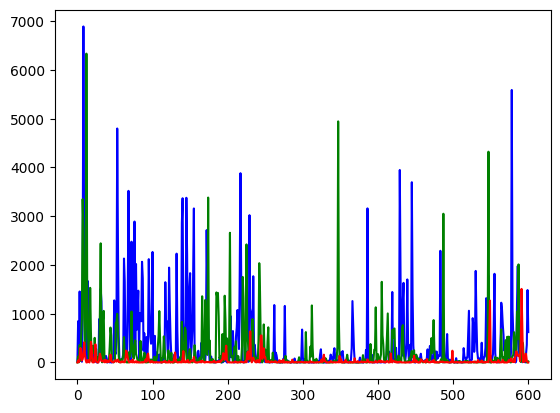

In [50]:
#Vẽ mức năng lượng so sánh 3 trạng thái
plt.plot(power_result['focus']['Subject_1']['Day_1'][2,1,:], color = 'blue')
plt.plot(power_result['unfocus']['Subject_1']['Day_1'][2,1,:], color = 'green')
plt.plot(power_result['drowsy']['Subject_1']['Day_1'][2,1,:],color = 'red')

Nhận xét: màu đỏ tượng trưng cho trạng thái buồn ngủ, màu xanh lá(không tập trung) cường độ mạnh nhưng mạnh nhất là màu xanh dương(tập trung)


In [51]:
#Gộp các bin tần số
def combine_bins(power_result, n_bins=36, bin_size=4):
    power_result_binned = {}

    # Duyệt qua từng trạng thái (focus, unfocus, drowsy)
    for state, subjects_data in power_result.items():
        power_result_binned[state] = {}
        for subject, days_data in subjects_data.items():
            power_result_binned[state][subject] = {}
            for day, power in days_data.items():
                n_channels, n_freq_bins, n_time_windows = power.shape

                # Tạo mảng lưu dữ liệu đã gộp bins
                power_binned = np.zeros((n_channels, n_bins, n_time_windows))

                # Gộp các bins theo khoảng bin_size (0.5 Hz)
                for ch in range(n_channels):
                    for j in range(n_bins):
                        start_idx = j * bin_size
                        end_idx = start_idx + bin_size
                        power_binned[ch, j, :] = np.mean(power[ch, start_idx:end_idx, :], axis=0)

                # Lưu kết quả cho subject và day
                power_result_binned[state][subject][day] = power_binned

    return power_result_binned


In [52]:
#kiểm tra thử trên 1 người
power_result_binned = combine_bins(power_result, n_bins=36, bin_size=4)
power_result_binned['focus']['Subject_1']['Day_1'].shape

(7, 36, 601)

In [53]:
#Tính các kết quả trung bình qua từng cửa sổ
def average_running_window(power_result_binned, window_size=15):
    power_result_averaged = {}

    # Duyệt qua từng trạng thái (focus, unfocus, drowsy)
    for state, subjects_data in power_result_binned.items():
        power_result_averaged[state] = {}
        for subject, days_data in subjects_data.items():
            power_result_averaged[state][subject] = {}
            for day, power in days_data.items():
                n_channels, n_bins, n_time_windows = power.shape
                n_output_time_windows = n_time_windows - window_size + 1  # Số cửa sổ chạy

                # Tạo mảng lưu dữ liệu trung bình
                power_averaged = np.zeros((n_channels, n_bins, n_output_time_windows))

                # Tính trung bình qua cửa sổ chạy
                for t in range(n_output_time_windows):
                    power_averaged[:, :, t] = np.mean(power[:, :, t:t + window_size], axis=2)

                # Lưu kết quả cho subject và day
                power_result_averaged[state][subject][day] = power_averaged

    return power_result_averaged


In [54]:
#kiểm tra trên 1 người
power_result_averaged = average_running_window(power_result_binned, window_size=15)
power_result_averaged['focus']['Subject_1']['Day_1'].shape

(7, 36, 587)

In [55]:
focus = {}
unfocus = {}
drowsy = {}

# Initialize the dictionaries with zeros
for subject in power_result_averaged['focus'].keys():
    n_channels, n_frequencies, n_time_windows = power_result_averaged['focus'][subject]['Day_1'].shape
    focus[subject] = {day: np.zeros([n_channels * n_frequencies, n_time_windows]) for day in power_result_averaged['focus'][subject].keys()}
    unfocus[subject] = {day: np.zeros([n_channels * n_frequencies, n_time_windows]) for day in power_result_averaged['focus'][subject].keys()}
    drowsy[subject] = {day: np.zeros([n_channels * n_frequencies, n_time_windows]) for day in power_result_averaged['focus'][subject].keys()}

# Reshape and log-transform the data
for subject in power_result_averaged['focus'].keys():
    for day in power_result_averaged['focus'][subject].keys():
        for j in range(n_time_windows):
            focus[subject][day][:, j] += power_result_averaged['focus'][subject][day][:, :, j].flatten()
            unfocus[subject][day][:, j] += power_result_averaged['unfocus'][subject][day][:, :, j].flatten()
            drowsy[subject][day][:, j] += power_result_averaged['drowsy'][subject][day][:, :, j].flatten()

        # Apply log-transform
        focus[subject][day] = 10 * np.log10(focus[subject][day])
        unfocus[subject][day] = 10 * np.log10(unfocus[subject][day])
        drowsy[subject][day] = 10 * np.log10(drowsy[subject][day])


In [56]:
focus['Subject_1']['Day_1'].shape

(252, 587)

## 3.Label and Split Data

### 3.1 Label data

In [57]:
label_focus = [0]*focus['Subject_1']['Day_1'].shape[1]
label_unfocus = [1]*focus['Subject_1']['Day_1'].shape[1]
label_drowsy = [2]*focus['Subject_1']['Day_1'].shape[1]


target=[]
subj=np.array([]).reshape(252,0).copy()
for name in focus.keys():
    subj=np.concatenate((subj,focus[name][day]), axis=1)
    subj=np.concatenate((subj,unfocus[name][day]), axis=1)
    subj=np.concatenate((subj,drowsy[name][day]), axis=1)
    target = target+label_focus+label_unfocus+label_drowsy
subj=subj.T
target = np.array(target)
# Combine data for all subjects and days
combined_data = []
combined_labels = []

for name in focus.keys():
    for day in focus[name].keys():
        combined_data.append(focus[name][day])
        combined_labels.extend(label_focus)
        combined_data.append(unfocus[name][day])
        combined_labels.extend(label_unfocus)
        combined_data.append(drowsy[name][day])
        combined_labels.extend(label_drowsy)

# Convert to numpy arrays
combined_data = np.concatenate(combined_data, axis=1).T
combined_labels = np.array(combined_labels)

In [58]:
combined_data.shape

(40503, 252)

Gộp tất cả dữ liệu lại của các trạng thái buồn ngủ , tập trung,không tập trung và gán labels cho từng trạng thái

### 3.2 Split data

In [59]:

# Split the data into training and testing sets
data_train, data_test, labels_train, labels_test = train_test_split(combined_data, combined_labels, test_size=0.2, random_state=42)
scaler = StandardScaler()
data_train_scaled = scaler.fit_transform(data_train)
data_test_scaled = scaler.transform(data_test)


Phân chia dữ liệu theo tập train và test

## 4.Model Development

Ta chọn 2 mô hình để train là SVM và CNN

| *Đặc điểm*                               | *SVM (Support Vector Machine)*                               | *CNN (Convolutional Neural Network)*                      | **Random Forest(RF)                             |  
|-------------------------------------------|--------------------------------------------------------------|-------------------------------------------------------------| -----------------------------------------------|                            
| *Mục tiêu*                              | Tìm biên phân tách tốt nhất giữa các lớp bằng cách tối đa hóa khoảng cách biên (margin). | Tự động học đặc trưng từ dữ liệu đầu vào và tối ưu hóa thông qua các lớp tích chập. |Tạo ra nhiều cây quyết định và kết hợp kết quả để phân loại chính xác hơn.|
| *Loại phương pháp*                     | Giám sát (Supervised).                                       | Giám sát (Supervised).                                      |Giám sát (Supervised).                          |
| *Dữ liệu đầu vào*                       | Dữ liệu đã trích xuất đặc trưng hoặc được ánh xạ vào không gian cao chiều. | Dữ liệu thô hoặc bán thô như ảnh, tín hiệu EEG (theo thời gian hoặc tần số). |Dữ liệu có đặc trưng rõ ràng, có thể là dữ liệu số hoặc các đặc trưng đã được trích xuất.  |
| *Khả năng mở rộng*                     | Hỗ trợ dữ liệu phi tuyến với kernel (RBF, polynomial, custom kernel). | Tự động học đặc trưng phi tuyến từ dữ liệu thông qua nhiều lớp. |Khả năng mở rộng tốt, xử lý được dữ liệu lớn và có thể được cải thiện với nhiều cây         |
| *Xử lý dữ liệu phi tuyến*               | Dùng kernel trick để ánh xạ dữ liệu sang không gian cao chiều để phân tách tuyến tính. | Học trực tiếp đặc trưng phi tuyến từ dữ liệu qua các lớp tích chập. |Xử lý tốt dữ liệu phi tuyến thông qua các cây quyết định kết hợp.               |
| *Số lượng tham số cần học*              | Số lượng tham số ít hơn, chỉ liên quan đến các vector hỗ trợ. | Số lượng lớn, bao gồm nhiều lớp tích chập, pooling và fully connected. |Số lượng tham số phụ thuộc vào số lượng cây, thường ít tham số hơn CNN.          |
| *Ứng dụng*                              | Phân loại tín hiệu, phát hiện trạng thái não (tập trung, buồn ngủ), phân loại bệnh lý. | Phân loại tín hiệu EEG thô, phát hiện động kinh, nhận dạng trạng thái não. |Phân loại dữ liệu số, dự đoán bệnh lý, phát hiện gian lận, phân loại ảnh (có thể với các đặc trưng đã trích xuất).      |
| *Khả năng xử lý dữ liệu lớn*            | Hạn chế với dữ liệu lớn hoặc có nhiều chiều, yêu cầu giảm chiều dữ liệu trước. | Phù hợp với dữ liệu lớn và phức tạp, tự động trích xuất đặc trưng từ dữ liệu lớn. |Có thể xử lý tốt dữ liệu lớn mà không cần giảm chiều dữ liệu.        |
| *Khả năng thích ứng*                    | Phù hợp với dữ liệu nhỏ và các bài toán đơn giản.            | Phù hợp với dữ liệu lớn và phức tạp như EEG nhiều kênh và nhiều thời điểm. |Phù hợp với nhiều loại dữ liệu và các bài toán phức tạp, đặc biệt khi dữ liệu có sự biến động.         |
| *Tính toán*                             | Cần nhiều thời gian khi dữ liệu lớn, nhưng hiệu quả khi dữ liệu nhỏ. | Yêu cầu tính toán cao và cần GPU để tăng tốc độ xử lý.       |Tính toán nhanh hơn so với SVM và CNN, có thể xử lý song song.      |

####What is SVM?
Support Vector Machine (SVM) là một thuật toán học có giám sát, được sử dụng để phân loại và hồi quy. Trong phân loại, SVM hoạt động bằng cách tìm kiếm một siêu phẳng (hyperplane) tối ưu để phân chia dữ liệu thành các lớp khác nhau. Mục tiêu của SVM là tối đa hóa khoảng cách giữa các điểm dữ liệu gần nhất của hai lớp và siêu phẳng phân chia chúng. Khoảng cách này được gọi là lề (margin), và một siêu phẳng với lề lớn hơn thường có khả năng tổng quát hóa tốt hơn khi phân loại các điểm dữ liệu mới.
1. Nguyên lý hoạt động của SVM
   - **Tìm Siêu phẳng Tối ưu:** SVM tìm kiếm siêu phẳng tối ưu để phân chia các lớp bằng cách tối đa hóa lề giữa các điểm dữ liệu gần nhất của hai lớp (các điểm này được gọi là các vector hỗ trợ (support vectors)). Đối với bài toán tuyến tính, siêu phẳng này có thể được biểu diễn bởi phương trình: $w \cdot x + b = 0$. $w$ là vector trọng số, hay vector pháp tuyến (normal vector) của siêu phẳng tối ưu, $x$ là vector đại diện cho các điểm dữ liệu, $b$ là bias, hay độ dịch của siêu phẳng tối ưu.
   - **Tối ưu hóa Lề:** SVM tối ưu hóa lề bằng cách tìm các vector hỗ trợ và thiết lập khoảng cách giữa chúng và siêu phẳng tối ưu. Lề lớn hơn giúp giảm nguy cơ overfitting, cải thiện khả năng dự đoán trên dữ liệu mới.


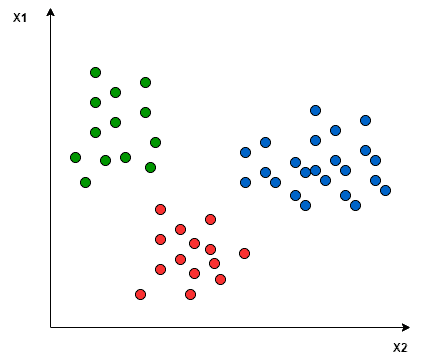

2. SVM multi class
Support Vector Machines (SVM) ban đầu là một kỹ thuật phân loại nhị phân, tức là chỉ phân biệt hai lớp dữ liệu. Để mở rộng cho bài toán phân loại nhiều lớp (multi-class classification), SVM thường sử dụng hai phương pháp chính.

a. One-vs-One (OvO):
   - Với mỗi cặp lớp trong bộ dữ liệu, một bộ phân loại SVM sẽ được huấn luyện riêng, nghĩa là nếu có \( k \) lớp, sẽ có \( \frac{k \times (k-1)}{2} \) bộ phân loại.
   - Trong giai đoạn dự đoán, mỗi bộ phân loại sẽ đưa ra một kết quả và lớp được dự đoán nhiều lần nhất (the "voting" mechanism) sẽ là kết quả cuối cùng.
   - Phương pháp này thích hợp cho số lượng lớp nhỏ, nhưng khi số lượng lớp tăng lên, số lượng mô hình cần huấn luyện cũng tăng theo cấp số nhân, dẫn đến chi phí tính toán lớn.

   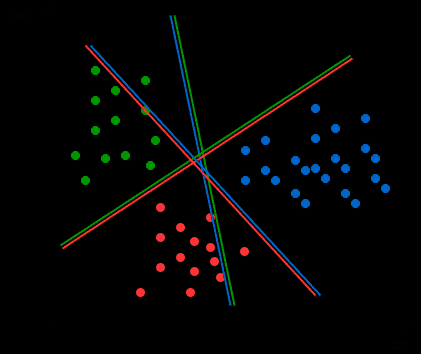

b. One-vs-Rest (OvR):
   - Với phương pháp này, cho mỗi lớp \( i \), SVM sẽ huấn luyện một bộ phân loại để phân biệt lớp \( i \) với tất cả các lớp còn lại.
   - Nếu có \( k \) lớp, thì sẽ cần huấn luyện \( k \) bộ phân loại SVM.
   - Khi dự đoán, lớp có giá trị quyết định cao nhất từ các bộ phân loại sẽ được chọn làm kết quả. Đây là phương pháp phổ biến hơn vì dễ triển khai và thường hiệu quả hơn khi có số lớp lớn.

   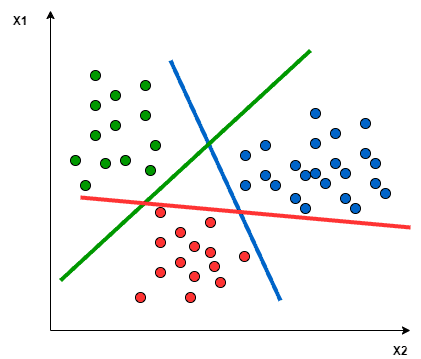

2. SVM với Nhân (Kernel)
- Với các dữ liệu phức tạp hoặc không thể phân tách tuyến tính, SVM sử dụng hàm kernel để biến đổi dữ liệu thành không gian đặc trưng cao hơn, nơi các lớp có thể phân tách dễ dàng hơn hay trong bài này sẽ sử dụng 2 lọa kernel.
   - **Linear Kernel:** Phù hợp cho dữ liệu có thể phân tách tuyến tính.
   - Ví dụ Linear Kernel: tưởng tượng dữ liệu nằm trong hình tròn, với một nhóm ở trong vòng tròn và một nhóm ở ngoài. Khi đó, một đường thẳng sẽ không thể chia tách hai nhóm này rõ ràng được   -> ta sử dụng kernel nâng chiều lên bậc 3 -> dùng một mặt phẳng để cắt qua chóp, tạo ra hai phần rõ ràng (phần trên và phần dưới).

   - **Radial Basis Function (RBF) Kernel:** Là hàm kernel phổ biến nhất cho dữ liệu không tuyến tính, biến đổi dữ liệu vào một không gian vô hạn chiều, giúp phân tách các điểm dữ liệu phức tạp.
   - Ví dụ Radial Basis Function (RBF) Kernel: ** ở trong một sân trường lớn và muốn nhóm các bạn học sinh lại thành hai nhóm nhóm thân thiết và nhóm ít quen biết. Thay vì dùng một dây thừng hoặc vạch một đường thẳng để chia hai nhóm, bạn sẽ dựa vào khoảng cách giữa các bạn với nhau để xác định ai sẽ vào nhóm nào -> RBF sẽ dựa vào sự xa gần, khác với chia đường thẳng.

####Benefits of svm for data
Phân tách phi tuyến tính: Với kernel trick (RBF, polynomial), SVM có thể tìm các biên phân tách phi tuyến giữa các lớp, hữu ích nếu dữ liệu EEG có quan hệ phức tạp.



### 4.1 Apply model                                          SVM kernel = RBF

In [60]:
# Tạo mô hình SVM
svm_model = SVC(kernel='rbf', C=1.0, random_state=42, probability=True)

# Đo thời gian huấn luyện
start_train = time.time()
svm_model.fit(data_train_scaled, labels_train)
end_train = time.time()
train_time_svm = end_train - start_train

# Đo thời gian dự đoán
start_predict = time.time()
y_pred = svm_model.predict(data_test_scaled)
end_predict = time.time()
predict_time_svm = end_predict - start_predict

# Đánh giá hiệu năng
print("Model SVM: ")

# Ma trận nhầm lẫn
print("Confusion Matrix:")
print(confusion_matrix(labels_test, y_pred))

# Báo cáo phân loại
report_svm = classification_report(labels_test, y_pred)
print("\nClassification Report:")
print(report_svm)

# Độ chính xác trên tập huấn luyện và kiểm tra
train_svm_accuracy = svm_model.score(data_train_scaled, labels_train)
svm_acc = accuracy_score(labels_test, y_pred)
print(f"\nTrain Accuracy: {train_svm_accuracy:.4f}")
print(f"Test Accuracy: {svm_acc:.4f}")

# Thời gian huấn luyện và dự đoán
print(f"\nTraining Time: {train_time_svm:.2f} seconds")
print(f"Prediction Time: {predict_time_svm:.2f} seconds")

Model SVM: 
Confusion Matrix:
[[2627  100    1]
 [ 156 2464   42]
 [  12   67 2632]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.96      0.95      2728
           1       0.94      0.93      0.93      2662
           2       0.98      0.97      0.98      2711

    accuracy                           0.95      8101
   macro avg       0.95      0.95      0.95      8101
weighted avg       0.95      0.95      0.95      8101


Train Accuracy: 0.9640
Test Accuracy: 0.9533

Training Time: 642.25 seconds
Prediction Time: 28.10 seconds


### 4.2 Apply model Random Forest

Cụ thể thuật toán này tạo ra nhiều cây quyết định mà mỗi cây quyết định được huấn luyện dựa trên nhiều mẫu con khác nhau và kết quả dự báo là bầu cử (voting) từ toàn bộ những cây quyết định. Như vậy một kết quả dự báo được tổng hợp từ nhiều mô hình nên kết quả của chúng sẽ không bị chệch. Đồng thời kết hợp kết quả dự báo từ nhiều mô hình sẽ có phương sai nhỏ hơn so với chỉ một mô hình. Điều này giúp cho mô hình khắc phục được hiện tượng quá khớp

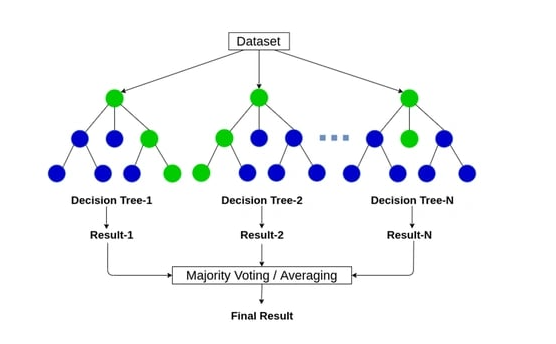


In [61]:
# Tạo mô hình Random Forest
rf_model = RandomForestClassifier(n_estimators=50, random_state=42)

# Đo thời gian huấn luyện
start_train = time.time()
rf_model.fit(data_train_scaled, labels_train)
end_train = time.time()

# Tính thời gian huấn luyện
train_time_rf = end_train - start_train

# Đo thời gian dự đoán
start_predict = time.time()
labels_pred = rf_model.predict(data_test_scaled)
end_predict = time.time()

# Tính thời gian dự đoán
predict_time_rf = end_predict - start_predict

print("Model Random Forest: ")

# Đánh giá hiệu năng
print("Confusion Matrix:")
print(confusion_matrix(labels_test, labels_pred))

report_rf = classification_report(labels_test, labels_pred)
print("\nClassification Report:")
print(report_rf)

# Tính độ chính xác
train_accuracy_rf = rf_model.score(data_train_scaled, labels_train)
accuracy_rf = accuracy_score(labels_test, labels_pred)
print(f"\nTrain Accuracy: {train_accuracy_rf:.4f}")
print(f"Test Accuracy: {accuracy_rf:.4f}")

# In thời gian huấn luyện và dự đoán
print(f"\nTraining Time: {train_time_rf:.2f} seconds")
print(f"Prediction Time: {predict_time_rf:.2f} seconds")


Model Random Forest: 
Confusion Matrix:
[[2713   13    2]
 [  33 2618   11]
 [   0   27 2684]]

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2728
           1       0.98      0.98      0.98      2662
           2       1.00      0.99      0.99      2711

    accuracy                           0.99      8101
   macro avg       0.99      0.99      0.99      8101
weighted avg       0.99      0.99      0.99      8101


Train Accuracy: 1.0000
Test Accuracy: 0.9894

Training Time: 39.60 seconds
Prediction Time: 0.08 seconds


### 4.3 Compare Model Performance

In [62]:
import numpy as np
import matplotlib.pyplot as plt


def plot_auc_roc_comparison(model1, model2, data_test, labels_test, n_classes, model_names=("Model 1", "Model 2")):
    """
    Hàm vẽ biểu đồ AUC-ROC so sánh hai mô hình.

    Parameters:
    - model1, model2: Các mô hình đã huấn luyện, có phương thức `predict_proba`.
    - data_test: Dữ liệu kiểm tra (scaled).
    - labels_test: Nhãn kiểm tra (dạng integer).
    - n_classes: Số lớp trong bài toán phân loại.
    - model_names: Tuple chứa tên của hai mô hình để hiển thị trên biểu đồ.
    """
    # Chuyển nhãn kiểm tra sang dạng nhị phân
    labels_test_binarized = label_binarize(labels_test, classes=np.arange(n_classes))

    def calculate_roc_auc(model, data_test, labels_test_binarized):
        # Dự đoán xác suất
        y_score = model.predict_proba(data_test)

        # Tính ROC và AUC cho từng lớp
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(labels_test_binarized[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Tính macro-average ROC và AUC
        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
        mean_tpr /= n_classes
        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        return fpr, tpr, roc_auc

    # Tính ROC và AUC cho cả hai mô hình
    fpr1, tpr1, roc_auc1 = calculate_roc_auc(model1, data_test, labels_test_binarized)
    fpr2, tpr2, roc_auc2 = calculate_roc_auc(model2, data_test, labels_test_binarized)

    # Vẽ Subplot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Vẽ ROC cho Model 1
    colors = ['blue', 'green', 'red']
    for i, color in enumerate(colors):
        axes[0].plot(fpr1[i], tpr1[i], color=color, lw=2,
                     label=f"Class {i} (AUC = {roc_auc1[i]:.2f})")
    axes[0].plot(fpr1["macro"], tpr1["macro"], color='navy', linestyle='--', lw=2,
                 label=f"Macro-Average (AUC = {roc_auc1['macro']:.2f})")
    axes[0].plot([0, 1], [0, 1], color='gray', linestyle='--', lw=1)
    axes[0].set_title(f"{model_names[0]} ROC Curve", fontsize=14)
    axes[0].set_xlabel("False Positive Rate (FPR)", fontsize=12)
    axes[0].set_ylabel("True Positive Rate (TPR)", fontsize=12)
    axes[0].legend(loc="lower right", fontsize=10)
    axes[0].grid(alpha=0.3)

    # Vẽ ROC cho Model 2
    for i, color in enumerate(colors):
        axes[1].plot(fpr2[i], tpr2[i], color=color, lw=2,
                     label=f"Class {i} (AUC = {roc_auc2[i]:.2f})")
    axes[1].plot(fpr2["macro"], tpr2["macro"], color='navy', linestyle='--', lw=2,
                 label=f"Macro-Average (AUC = {roc_auc2['macro']:.2f})")
    axes[1].plot([0, 1], [0, 1], color='gray', linestyle='--', lw=1)
    axes[1].set_title(f"{model_names[1]} ROC Curve", fontsize=14)
    axes[1].set_xlabel("False Positive Rate (FPR)", fontsize=12)
    axes[1].legend(loc="lower right", fontsize=10)
    axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()


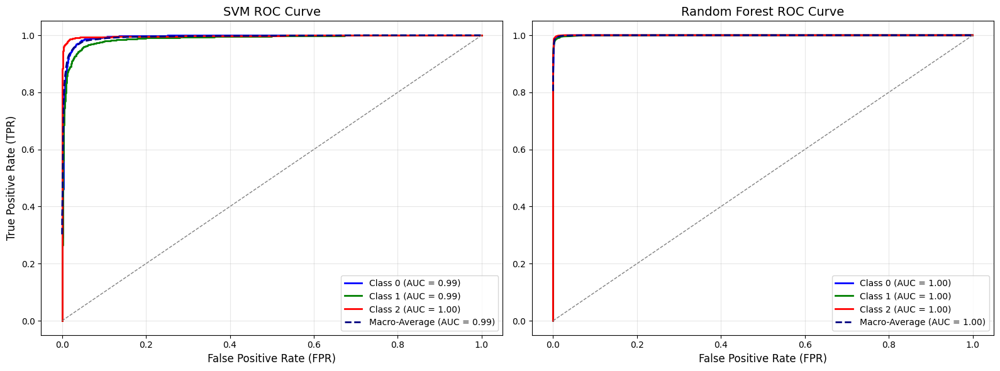

In [63]:
# Số lớp
n_classes = len(np.unique(labels_test))

# So sánh SVM và Random Forest
plot_auc_roc_comparison(svm_model, rf_model, data_test_scaled, labels_test,
                        n_classes=n_classes, model_names=("SVM", "Random Forest"))

In [64]:
# Tạo một dictionary để lưu các thông số hiệu năng
performance_data = {
    'Model': ['SVM', 'Random Forest'],
    'Train Accuracy': [train_svm_accuracy, train_accuracy_rf],
    'Test Accuracy': [svm_acc, accuracy_rf],
    'Training Time (seconds)': [train_time_svm, train_time_rf],
    'Prediction Time (seconds)': [predict_time_svm, predict_time_rf]
}


svm_report = classification_report(labels_test, y_pred, output_dict=True)
svm_df = pd.DataFrame(svm_report).transpose()


rf_report = classification_report(labels_test, labels_pred, output_dict=True)
rf_df = pd.DataFrame(rf_report).transpose()

# Chuyển dictionary thành DataFrame
performance_df = pd.DataFrame(performance_data)
comparison_df = pd.concat([svm_df, rf_df], axis=0)

In [65]:
print("Comparison Performance Model SVM vs Random Forest:")
performance_df

Comparison Performance Model SVM vs Random Forest:


,Model,Train Accuracy,Test Accuracy,Training Time (seconds),Prediction Time (seconds)
0,SVM,0.963953,0.953339,642.253887,28.104306
1,Random Forest,1.000000,0.989384,39.600511,0.075262


In [66]:
print("Comparison Precision, Recall, F1 score SVM vs Random Forest:")
comparison_df

Comparison Precision, Recall, F1 score SVM vs Random Forest:


,precision,recall,f1-score,support
0,0.939893,0.962977,0.951295,2728.000000
1,0.936526,0.925620,0.931041,2662.000000
2,0.983925,0.970859,0.977349,2711.000000
accuracy,0.953339,0.953339,0.953339,0.953339
macro avg,0.953448,0.953152,0.953228,8101.000000
weighted avg,0.953522,0.953339,0.953358,8101.000000
0,0.987983,0.994501,0.991231,2728.000000
1,0.984951,0.983471,0.984211,2662.000000
2,0.995180,0.990041,0.992604,2711.000000
accuracy,0.989384,0.989384,0.989384,0.989384


Model cho ra kết quả quá tốt trên tập train và test đã đặt ra cho chúng em câu hỏi liệu trong quá trình xử lí dữ liệu có sai ở đâu không. Từ thử nghiệm bằng các model chúng ta nhận ra có khả năng chúng ta đã bị Leakage Data. Chúng em cần xem lại quá trình xử lí để có thể đánh giá chính xác vấn đề gặp phải.

## 5 Hướng giải quyết cho vấn đề dự đoán của các model ra quá cao

Các bước xử lí dữ liệu bằng STFT:
1. Tính phổ năng lượng (power spectrum) của tín hiệu EEG theo tần số bằng cách sử dụng STFT (Short-Time Fourier Transform).
2. Gộp các tần số thành các bins có kích thước khoảng 0.5Hz để giảm kích thước dữ liệu và tập trung vào các dải tần số quan trọng từ 0.5 - 18Hz
3. Tính trung bình qua các cửa sổ thời gian chạy (sliding window) 15s để làm mượt tín hiệu và loại bỏ nhiễu trong dữ liệu.

->  Quá trình trích xuất đặc trưng bên dưới ở bước 3 chúng em đã sử dụng sliding window với thời gian 15s để tính trung bình các giá trị trích xuất ở miền tần số với cửa sổ trượt 15s. Chính vì thế ở bước chia dữ liệu của tụi em được chia thành tập train và test một cách ngãu nhiên giữa các đối tượng gây nên vấn đề Leakage Data.

**Chúng em đã nghĩ ra hướng giải quyết bằng cach sử dụng cách chia dữ liệu với tập test là dữ liệu của từng người tham gia (subject) để đánh giá khách quan nhất về hiệu xuất của mô hình.**


### 5.1 Chia lại dữ liệu và gán label

In [87]:
def split_and_concatenate_states(focus, unfocus, drowsy, test_subject):
    train_data = []
    train_labels = []
    test_data = []
    test_labels = []

    # Dictionary chứa dữ liệu và nhãn trạng thái
    states = {'focus': focus, 'unfocus': unfocus, 'drowsy': drowsy}
    state_labels = {'focus': 0, 'unfocus': 1, 'drowsy': 2}

    for state, data in states.items():
        for subject, days_data in data.items():
            # Gộp dữ liệu từ tất cả các ngày theo chiều 1
            concatenated_data = np.concatenate([days_data[day] for day in days_data.keys()], axis=1)

            if subject == test_subject:
                # Dữ liệu test
                test_data.append(concatenated_data.T)  # Transpose để mỗi hàng là một sample
                test_labels.extend([state_labels[state]] * concatenated_data.shape[1])
            else:
                # Dữ liệu train
                train_data.append(concatenated_data.T)  # Transpose để mỗi hàng là một sample
                train_labels.extend([state_labels[state]] * concatenated_data.shape[1])

    # Chuyển đổi sang numpy array
    train_data = np.concatenate(train_data, axis=0)
    train_labels = np.array(train_labels)
    test_data = np.concatenate(test_data, axis=0)
    test_labels = np.array(test_labels)

    return train_data, train_labels, test_data, test_labels


Tiến hành chia dữ liệu lựa chọn Subject 5 làm tập test và 4 Subject còn lại làm tập train.

In [134]:
data_train, train_labels, data_test, test_labels = split_and_concatenate_states(focus, unfocus, drowsy, 'Subject_5')

### 5.2 Thử nghiệm trên model




#### Thử nghiệm với SVM

In [90]:
# Huan luyện model SVM
# Khởi tạo model SVM với kernel RBF
svm_model = SVC(kernel='rbf', gamma='scale', class_weight='balanced')

# Huấn luyện model trên tập train
svm_model.fit(data_train, train_labels)

# Dự đoán trên tập train
predicted_labels_train = svm_model.predict(data_train)
# Dự đoán nhãn trên tập test
predicted_labels_test = svm_model.predict(data_test)

# Đánh giá model (ví dụ: độ chính xác)
accuracy_train = accuracy_score(train_labels, predicted_labels_train)
print(f"Train Accuracy of SVM model: {accuracy_train}")
accuracy_test = accuracy_score(test_labels, predicted_labels_test)
print(f"Test Accuracy of SVM model: {accuracy_test}")

Train Accuracy of SVM model: 0.9140141665919483
Test Accuracy of SVM model: 0.604344122657581


In [91]:
# Ma trận nhầm lẫn
print("Confusion Matrix:")
print(confusion_matrix(test_labels, predicted_labels_test))

# Báo cáo phân loại
print("\nClassification Report:")
print(classification_report(test_labels, predicted_labels_test))


Confusion Matrix:
[[1904  354   90]
 [1139  713  496]
 [ 433  275 1640]]

Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.81      0.65      2348
           1       0.53      0.30      0.39      2348
           2       0.74      0.70      0.72      2348

    accuracy                           0.60      7044
   macro avg       0.61      0.60      0.59      7044
weighted avg       0.61      0.60      0.59      7044



#### Thử nghiệm với Random Forest

In [92]:
rf_model = RandomForestClassifier(n_estimators=10, max_depth=10, random_state=42)

# Huấn luyện mô hình
rf_model.fit(data_train, train_labels)

predict_train = rf_model.predict(data_train)
predict_test = rf_model.predict(data_test)

# Đánh giá mô hình
accuracy_train = accuracy_score(train_labels, predict_train)
accuracy_test = accuracy_score(test_labels, predict_test)

print(f"Train Accuracy of Random Forest model: {accuracy_train}")
print(f"Test Accuracy of Random Forest model: {accuracy_test}")

# Ma trận nhầm lẫn
print("Confusion Matrix:")
print(confusion_matrix(test_labels, predict_test))

# Báo cáo phân loại
print("\nClassification Report:")
print(classification_report(test_labels, predict_test))

Train Accuracy of Random Forest model: 0.9357123643862638
Test Accuracy of Random Forest model: 0.5512492901760363
Confusion Matrix:
[[1601  493  254]
 [ 631  987  730]
 [ 397  656 1295]]

Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.68      0.64      2348
           1       0.46      0.42      0.44      2348
           2       0.57      0.55      0.56      2348

    accuracy                           0.55      7044
   macro avg       0.55      0.55      0.55      7044
weighted avg       0.55      0.55      0.55      7044



Nhìn chung sau khi thay đổi cách chia dữ liệu thì đã tránh được hiện tượng Leakage Data ở trên.

In [93]:
rf_model = RandomForestClassifier(n_estimators=6, max_depth=4, min_samples_leaf=300, max_features='log2', min_samples_split=400, random_state=42)

# Huấn luyện mô hình
rf_model.fit(data_train, train_labels)

predict_train = rf_model.predict(data_train)
predict_test = rf_model.predict(data_test)

# Đánh giá mô hình
accuracy_train = accuracy_score(train_labels, predict_train)
accuracy_test = accuracy_score(test_labels, predict_test)

print(f"Train Accuracy of Random Forest model: {accuracy_train}")
print(f"Test Accuracy of Random Forest model: {accuracy_test}")

# Ma trận nhầm lẫn
print("Confusion Matrix:")
print(confusion_matrix(test_labels, predict_test))

# Báo cáo phân loại
print("\nClassification Report:")
print(classification_report(test_labels, predict_test))


Train Accuracy of Random Forest model: 0.651005708479034
Test Accuracy of Random Forest model: 0.630465644520159
Confusion Matrix:
[[1418  478  452]
 [ 394 1255  699]
 [ 115  465 1768]]

Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.60      0.66      2348
           1       0.57      0.53      0.55      2348
           2       0.61      0.75      0.67      2348

    accuracy                           0.63      7044
   macro avg       0.64      0.63      0.63      7044
weighted avg       0.64      0.63      0.63      7044



Sử dụng phương pháp Leave One Subject Out - Cross Validation để đánh giá hiệu xuất của model Random Forest

In [94]:
def evaluation_model(model, focus, unfocus, drowsy):
    avg_score = []

    for i in range(1, 6):
        subject = f'Subject_{i}'
        data_train, train_labels, data_test, test_labels = split_and_concatenate_states(focus, unfocus, drowsy, subject)
        model.fit(data_train, train_labels)
        predict_train = model.predict(data_train)
        predict_test = model.predict(data_test)
        accuracy_train = accuracy_score(train_labels, predict_train)
        accuracy_test = accuracy_score(test_labels, predict_test)

        print(f"Evaluation is {subject} is test set")
        print(f"Accuracy train: {accuracy_train}")
        print(f"Accuracy test: {accuracy_test}")

        print("Confusion Matrix:")
        print(confusion_matrix(test_labels, predict_test))
        print("\nClassification Report:")
        print(classification_report(test_labels, predict_test))

        avg_score.append(accuracy_test)

    print(f"Average accuracy: {np.mean(avg_score)}")

In [95]:
evaluation_model(rf_model, focus, unfocus, drowsy)

Evaluation is Subject_1 is test set
Accuracy train: 0.6813679096472963
Accuracy test: 0.5700170357751277
Confusion Matrix:
[[1828 1067   40]
 [ 924 1671  340]
 [ 397 1018 1520]]

Classification Report:
              precision    recall  f1-score   support

           0       0.58      0.62      0.60      2935
           1       0.44      0.57      0.50      2935
           2       0.80      0.52      0.63      2935

    accuracy                           0.57      8805
   macro avg       0.61      0.57      0.58      8805
weighted avg       0.61      0.57      0.58      8805

Evaluation is Subject_2 is test set
Accuracy train: 0.6561612720045429
Accuracy test: 0.6094264622373652
Confusion Matrix:
[[1524 1405    6]
 [ 448 2246  241]
 [ 219 1120 1596]]

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.52      0.59      2935
           1       0.47      0.77      0.58      2935
           2       0.87      0.54      0.67      293

#### Hyper parameter bằng Grid Search với KFold = 5 Subjects

In [96]:
def prepare_data(focus, unfocus, drowsy):
    X, y, groups = [], [], []

    for state, label in zip([focus, unfocus, drowsy], [0, 1, 2]):  # 0: focus, 1: unfocus, 2: drowsy
        for subject, days in state.items():
            for day, data in days.items():
                X.append(data)
                y.append(np.full(data.shape[1], label))  # Gán nhãn cho toàn bộ khung thời gian trong day
                groups.append(np.full(data.shape[1], subject))  # Gán subject làm nhóm

    # Chuyển đổi thành NumPy array
    X = np.hstack(X).T  # Nối tất cả theo chiều 1
    y = np.hstack(y)
    groups = np.hstack(groups)

    return X, y, groups


In [98]:
from sklearn.model_selection import LeaveOneGroupOut, GridSearchCV

# Chuẩn bị dữ liệu
X, y, groups = prepare_data(focus, unfocus, drowsy)

# Tạo bộ chia Leave-One-Group-Out
logo = LeaveOneGroupOut()

# Định nghĩa mô hình và tham số cần grid search
model = RandomForestClassifier(random_state=42)
param_grid = {
    'n_estimators': [3, 5, 7],
    'max_depth': [1, 3, 5, 7],
    'min_samples_split': [100, 200, 300],
    'max_features': ['sqrt', 'log2']
}

# GridSearch với cross-validator tùy chỉnh
grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring='accuracy',
    cv=logo.split(X, y, groups),  # Sử dụng logo để chia dữ liệu
    verbose=1
)

# Huấn luyện và tìm tham số tốt nhất
grid_search.fit(X, y)

# In kết quả
print("Best parameters found:", grid_search.best_params_)
print("Best cross-validation accuracy:", grid_search.best_score_)


Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters found: {'max_depth': 7, 'max_features': 'sqrt', 'min_samples_split': 200, 'n_estimators': 5}
Best cross-validation accuracy: 0.5978478137421919


#### Confusion Matrix & AUC-ROC curve Evaluation

In [120]:
def evaluation_model_with_multiclass_roc_curve(model, focus, unfocus, drowsy, best_params, class_labels):
    # Khởi tạo mô hình với tham số tối ưu
    optimized_model = RandomForestClassifier(**best_params, random_state=42)

    for i in range(1, 6):
        subject = f'Subject_{i}'
        data_train, train_labels, data_test, test_labels = split_and_concatenate_states(focus, unfocus, drowsy, subject)

        # Huấn luyện mô hình trên tập train
        optimized_model.fit(data_train, train_labels)
        prob_test = optimized_model.predict_proba(data_test)  # Xác suất dự đoán

        # Vẽ ROC Curve cho từng class
        plt.figure(figsize=(8, 6))
        plt.title(f"ROC Curve for {subject}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.grid()

        # Xử lý từng class (One-vs-Rest)
        for class_idx, class_label in enumerate(class_labels):
            # Nhị phân hóa nhãn (class hiện tại là 1, còn lại là 0)
            binary_test_labels = (test_labels == class_idx).astype(int)

            # Tính FPR, TPR, và AUC cho class hiện tại
            fpr, tpr, _ = roc_curve(binary_test_labels, prob_test[:, class_idx])
            auc_score = auc(fpr, tpr)

            # Vẽ đường ROC cho class hiện tại
            plt.plot(fpr, tpr, label=f"{class_label} (AUC={auc_score:.2f})")

        plt.legend(loc="lower right")
        plt.show()

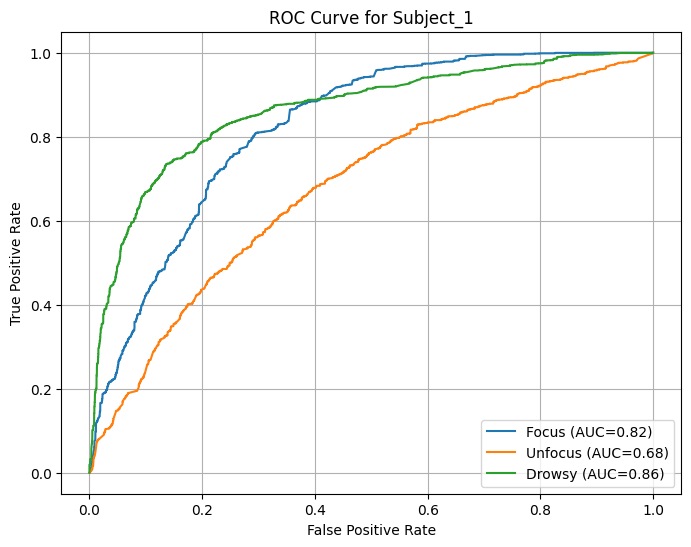

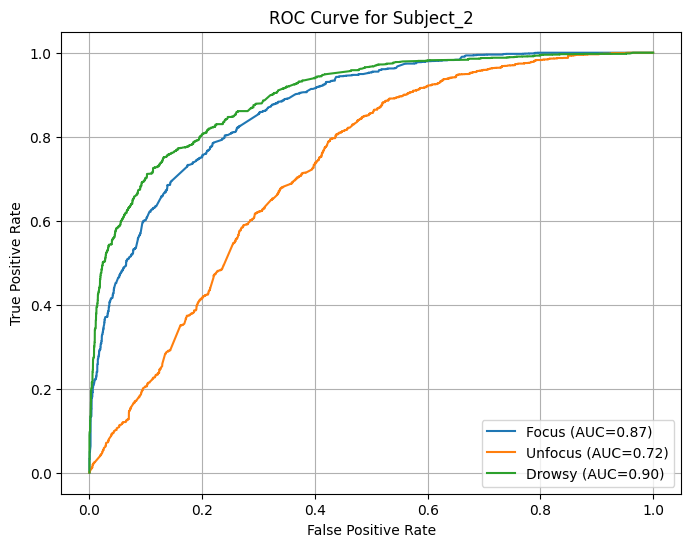

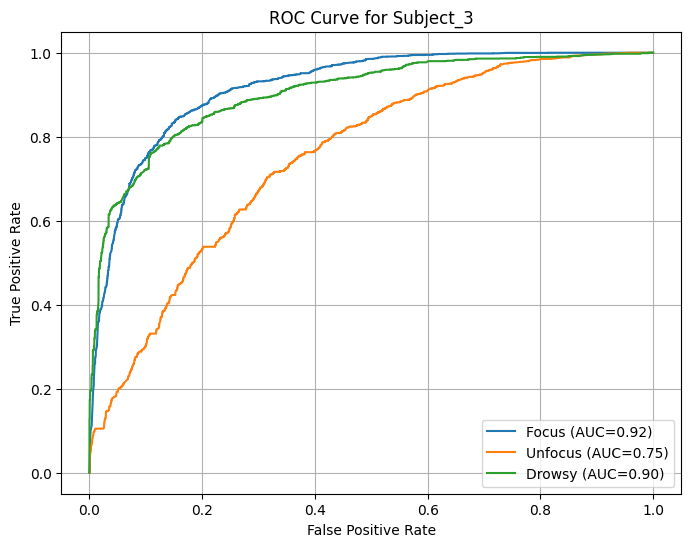

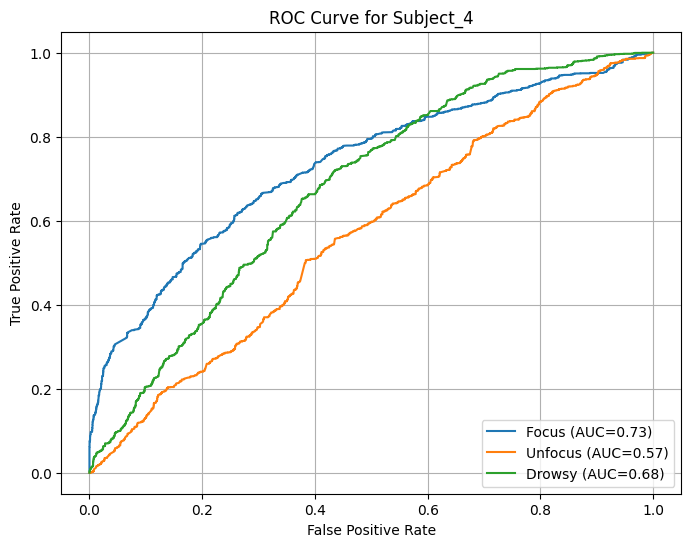

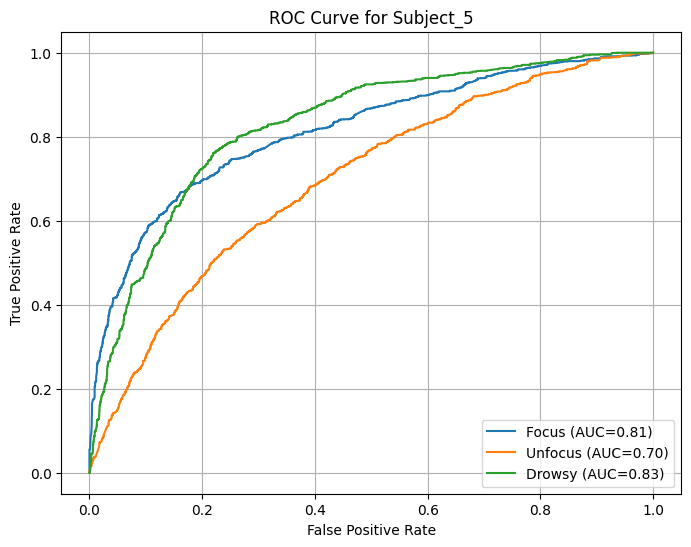

In [123]:
# Best parameters từ GridSearchCV
best_params = grid_search.best_params_

# Danh sách nhãn các class
class_labels = ['Focus', 'Unfocus', 'Drowsy']

# Đánh giá mô hình với ROC Curve cho 3 class
evaluation_model_with_multiclass_roc_curve(
    model=RandomForestClassifier(),
    focus=focus,
    unfocus=unfocus,
    drowsy=drowsy,
    best_params=best_params,
    class_labels=class_labels
)


Nhìn chung từ đường cong ROC thì có thể thây được các nhãn của Focus và Drowsy cho kết quả tốt hơn ở trển 5 Fold dữ liệu đánh giá khi các đường cong sát với đường viền hơn có thể thấy được rầng 2 nhãn này có khả năng phân loại tốt hơn so với nhãn Unfocus.

In [124]:
def plot_confusion_matrix_per_fold(model, focus, unfocus, drowsy, best_params, class_labels):
    # Khởi tạo mô hình với tham số tối ưu
    optimized_model = RandomForestClassifier(**best_params, random_state=42)

    for i in range(1, 6):
        subject = f'Subject_{i}'
        data_train, train_labels, data_test, test_labels = split_and_concatenate_states(focus, unfocus, drowsy, subject)

        # Huấn luyện mô hình trên tập train
        optimized_model.fit(data_train, train_labels)
        predict_test = optimized_model.predict(data_test)

        # Tính Confusion Matrix
        cm = confusion_matrix(test_labels, predict_test, labels=range(len(class_labels)))

        # Vẽ Confusion Matrix bằng seaborn
        plt.figure(figsize=(8, 6))
        sns.heatmap(
            cm,
            annot=True, fmt="d", cmap="Blues",
            xticklabels=class_labels, yticklabels=class_labels
        )
        plt.title(f"Confusion Matrix for {subject}")
        plt.xlabel("Predicted Labels")
        plt.ylabel("True Labels")
        plt.show()

        # In Classification Report
        print(f"Classification Report for {subject}:")
        print(classification_report(test_labels, predict_test, target_names=class_labels))


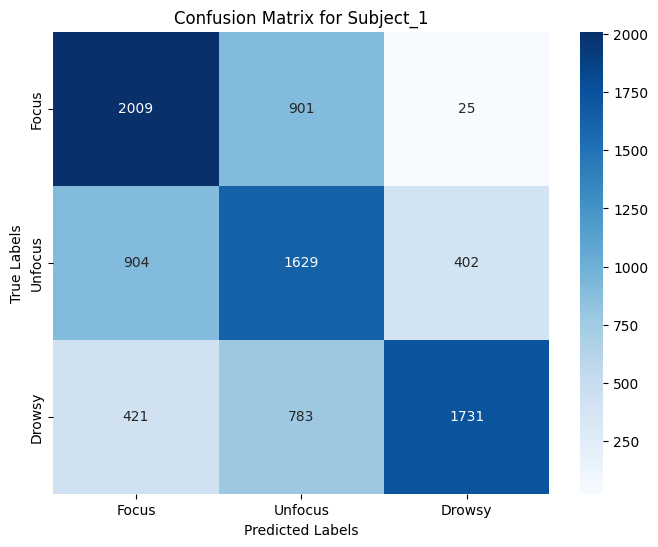

Classification Report for Subject_1:
              precision    recall  f1-score   support

       Focus       0.60      0.68      0.64      2935
     Unfocus       0.49      0.56      0.52      2935
      Drowsy       0.80      0.59      0.68      2935

    accuracy                           0.61      8805
   macro avg       0.63      0.61      0.61      8805
weighted avg       0.63      0.61      0.61      8805



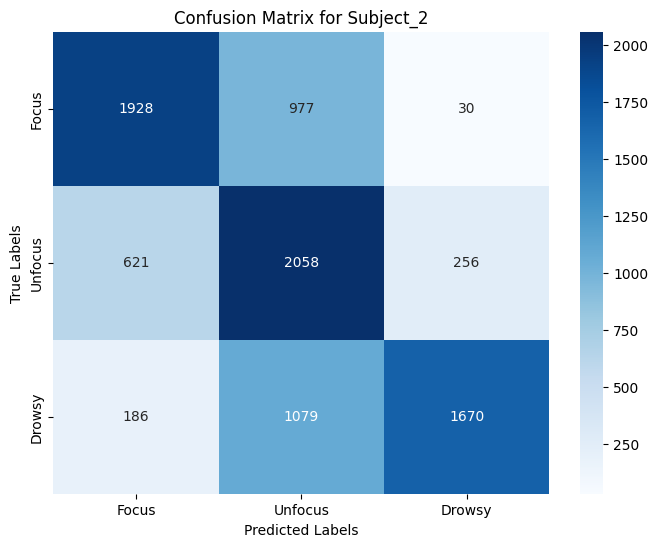

Classification Report for Subject_2:
              precision    recall  f1-score   support

       Focus       0.70      0.66      0.68      2935
     Unfocus       0.50      0.70      0.58      2935
      Drowsy       0.85      0.57      0.68      2935

    accuracy                           0.64      8805
   macro avg       0.69      0.64      0.65      8805
weighted avg       0.69      0.64      0.65      8805



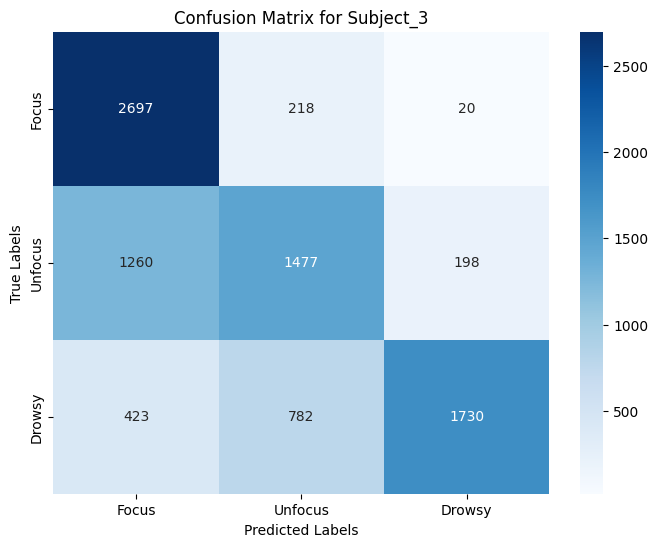

Classification Report for Subject_3:
              precision    recall  f1-score   support

       Focus       0.62      0.92      0.74      2935
     Unfocus       0.60      0.50      0.55      2935
      Drowsy       0.89      0.59      0.71      2935

    accuracy                           0.67      8805
   macro avg       0.70      0.67      0.66      8805
weighted avg       0.70      0.67      0.66      8805



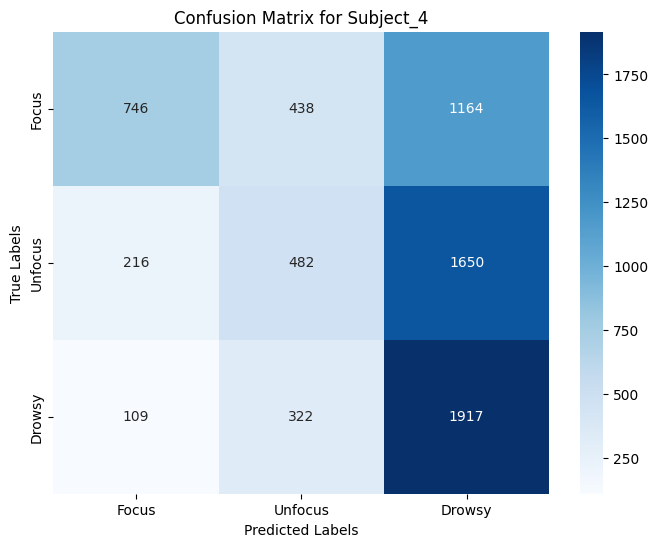

Classification Report for Subject_4:
              precision    recall  f1-score   support

       Focus       0.70      0.32      0.44      2348
     Unfocus       0.39      0.21      0.27      2348
      Drowsy       0.41      0.82      0.54      2348

    accuracy                           0.45      7044
   macro avg       0.50      0.45      0.42      7044
weighted avg       0.50      0.45      0.42      7044



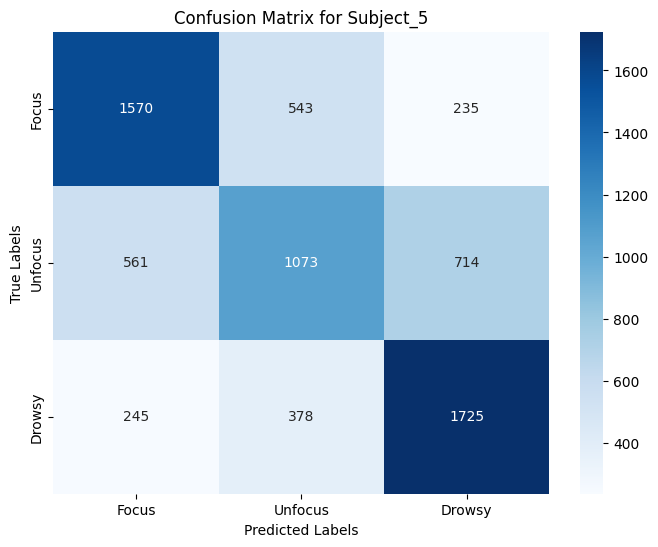

Classification Report for Subject_5:
              precision    recall  f1-score   support

       Focus       0.66      0.67      0.66      2348
     Unfocus       0.54      0.46      0.49      2348
      Drowsy       0.65      0.73      0.69      2348

    accuracy                           0.62      7044
   macro avg       0.61      0.62      0.62      7044
weighted avg       0.61      0.62      0.62      7044



In [125]:
# Vẽ Confusion Matrix cho từng fold
plot_confusion_matrix_per_fold(
    model=RandomForestClassifier(),
    focus=focus,
    unfocus=unfocus,
    drowsy=drowsy,
    best_params=best_params,
    class_labels=class_labels
)

Từ các biểu đồ Confusion matrix với 5 Subjects chúng em thấy rằng ở trường hợp Subject 4 làm tập test thì đã phần dữ liệu sẽ dự đoán về lớp Drowsy có thể dữ liệu của người thứ 4 này có tín hiệu sóng ở dải băng tần thấp hoạt động mạnh hơn so với các người tham gia khác dẫn đế dữ liệu có sự sai lệch rõ ràng khi dự đoán trên tập test là Subject 4.

## 5. Analyss and Visualization

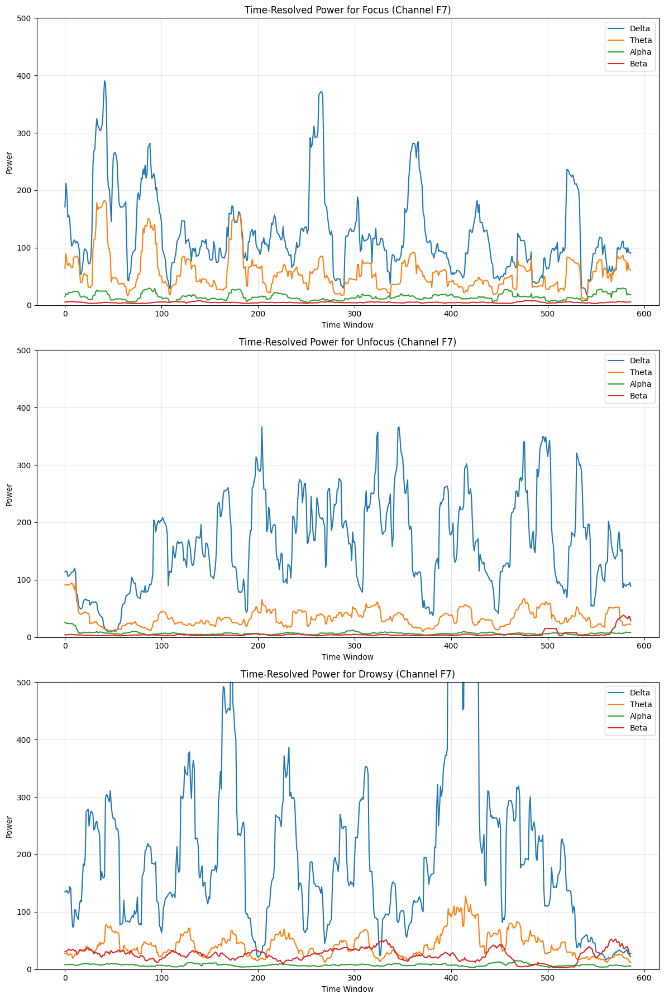

In [68]:
import matplotlib.pyplot as plt
import numpy as np

def compare_time_resolved_power_separated(power_averaged, states=['focus', 'unfocus', 'drowsy'], bins=[0, 3, 7, 12, 30], labels=['Delta', 'Theta', 'Alpha', 'Beta'], channel_name='F7', channel_names=None):
    # Kiểm tra nếu channel_names không được cung cấp, sử dụng mặc định
    if channel_names is None:
        channel_names = ['F7', 'F3', 'P7', 'O1', 'O2', 'P8', 'AF4']

    # Tìm chỉ số của kênh dựa trên tên kênh
    channel = channel_names.index(channel_name)

    # Lấy thời gian từ power_averaged
    time = np.arange(power_averaged['focus'][list(power_averaged['focus'].keys())[0]]['Day_1'].shape[2])

    # Tạo figure và axes cho từng trạng thái
    fig, axes = plt.subplots(len(states), 1, figsize=(12, 6 * len(states)))

    if len(states) == 1:
        axes = [axes]  # Chuyển axes thành list nếu chỉ có 1 trạng thái

    # Duyệt qua các trạng thái và vẽ biểu đồ cho mỗi trạng thái
    for idx, state in enumerate(states):
        ax = axes[idx]
        for start, end, label in zip(bins[:-1], bins[1:], labels):
            avg_power = np.mean(power_averaged[state][list(power_averaged[state].keys())[0]]['Day_2'][channel, start:end, :], axis=0)
            ax.plot(time, avg_power, label=f'{label}')

        # Thiết lập tiêu đề, nhãn và lưới cho từng subplot
        ax.set_title(f'Time-Resolved Power for {state.capitalize()} (Channel {channel_names[channel]})')
        ax.set_xlabel('Time Window')
        ax.set_ylabel('Power')
        ax.set_ylim(0, 500)  # Điều chỉnh mức giới hạn của trục y
        ax.legend()
        ax.grid(alpha=0.3)

    # Hiển thị biểu đồ
    plt.tight_layout()
    plt.show()


compare_time_resolved_power_separated(power_result_averaged, states=['focus', 'unfocus', 'drowsy'], channel_name='F7', channel_names=channel_names)


Nhận xét: từ mức năng lượng của các dải sóng ảnh hưởng đến việc dự đoán trạng thái của người tham gia. Trạng thái tập trung và không tập trung dường như có liên quan đến hoạt động sóng não EEG dải tần từ 1-10Hz như dải **Delta** và dải **Theta**. Và trạng thái buồn ngủ có thể được phân biệt bằng sự hoạt động các dải năng lượng **Alpha** có dải tần trong khoảng 10-15Hz

In [70]:
# from sklearn.ensemble import RandomForestClassifier

# # Lấy các tham số tốt nhất từ GridSearchCV
# best_params = grid_search.best_params_

# # Cấu hình lại mô hình với các tham số tốt nhất
# best_rf_model = RandomForestClassifier(
#     n_estimators=best_params['n_estimators'],
#     min_samples_leaf=best_params['min_samples_leaf'],
#     max_features=best_params['max_features'],
#     random_state=42
# )

# # Huấn luyện lại mô hình với dữ liệu huấn luyện
# best_rf_model.fit(data_train_scaled, labels_train)

# # Kiểm tra độ chính xác trên tập huấn luyện
# train_accuracy = best_rf_model.score(data_train_scaled, labels_train)
# print(f"Training Accuracy with Best Parameters: {train_accuracy}")
# test_accuracy = best_rf_model.score(data_test_scaled, labels_test)
# print(f"Test Accuracy with Best Parameters: {test_accuracy}")


Training Accuracy with Best Parameters: 1.0
Test Accuracy with Best Parameters: 0.9897543513146525


## 6. Proposal for Expansion





####1. What is Convolutional Neural Network (CNN)?
Convolutional Neural Network hay còn được viết tắt là CNN, trong tiếng Việt được gọi là mạng nơ-ron tích chập, là một trong những mô hình Deep Learning tiên tiến và hiện đại nhất hiện nay. Nhờ có CNN mà chúng ta có thể dễ dàng tạo dựng hệ thống mạng thông minh và có độ chính xác cao.

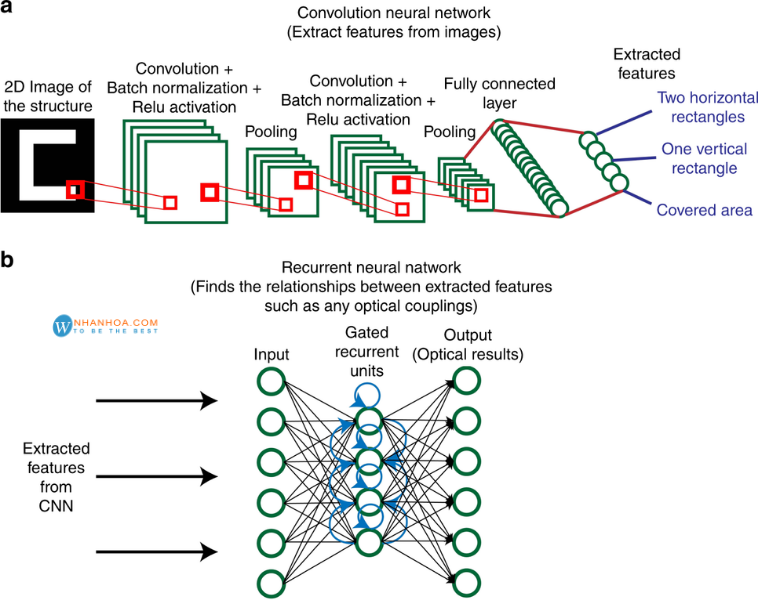

Convolutional Neural Network được sử dụng nhiều trong các bài toán nhận dạng các object trong ảnh. Để tìm hiểu tại sao thuật toán này được sử dụng rộng rãi cho việc nhận dạng (detection), chúng ta hãy cùng tìm hiểu về thuật toán này.


2. Convolutional là gì?
Là một cửa sổ trượt (Sliding Windows) trên một ma trận mô tả như hình

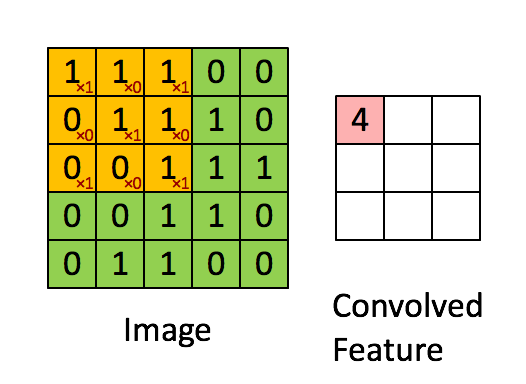

Các convolutional layer có các parameter(kernel) đã được học để tự điều chỉnh lấy ra những thông tin chính xác nhất mà không cần chọn các feature.

Trong hình ảnh ví dụ trên, ma trận bên trái là một hình ảnh trắng đen được số hóa. Ma trận có kích thước 5×5 và mỗi điểm ảnh có giá trị 1 hoặc 0 là giao điểm của dòng và cột.

Convolution hay tích chập là nhân từng phần tử trong ma trận 3. Sliding Window hay còn gọi là kernel, filter hoặc feature detect là một ma trận có kích thước nhỏ như trong ví dụ trên là 3×3.

Convolution hay tích chập là nhân từng phần tử bên trong ma trận 3×3 với ma trận bên trái. Kết quả được một ma trận gọi là Convoled feature được sinh ra từ việc nhận ma trận Filter với ma trận ảnh 5×5 bên trái.

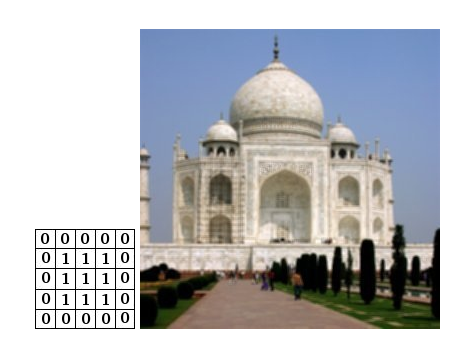

3. Cấu trúc của Convolutional Neural Network
Mạng CNN gồm nhiều lớp Convolution chồng lên nhau, sử dụng các hàm và tanh để kích hoạt các trọng số. Mỗi một lớp sau khi được kích hoạt sẽ cho ra kết quả trừu tượng cho các lớp tiếp theo. Mỗi layer kế tiếp chính là thể hiện kết quả của layer trước đó.

Thông qua quá trình training, các lớp layer CNN tự động học các giá trị được thể hiện qua các lớp filter.

Có 2 điều cần quan tâm ở mô hình CNN là tính bất biến và tính kết hợp. Trong trường hợp, cùng một đối tượng mà chiếu theo những góc khác nhau thì sẽ cho độ chính xác có sự bị ảnh hưởng.

Đối với phép dịch chuyển, quay và co dãn sẽ sử dụng pooling layer để sử dụng làm bất biến các tính chất kia. Vì vậy mà CNN đưa ra kết quả có độ chính xác cao ở các mô hình.

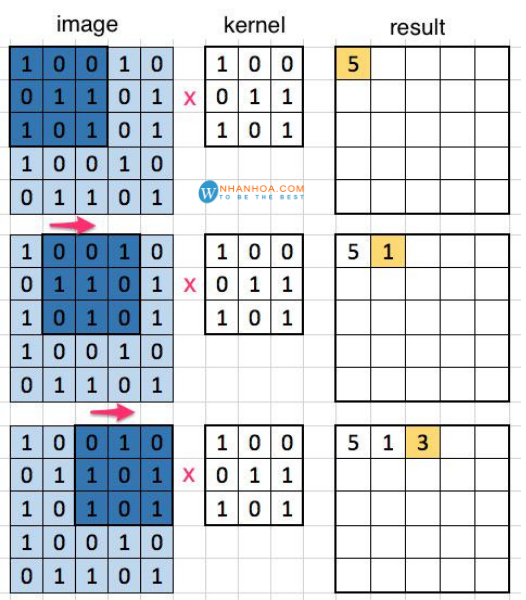



###Extract data on 3 frequency bands


In [72]:
def eeg_to_spectrum_images(data_split, fs, window_size, stride):
    freq_bands = {
        "theta": (4, 8),
        "alpha": (8, 13),
        "beta": (13, 18)
    }

    images = {}

    for state, subjects_data in data_split.items():
        images[state] = {}

        for subject, days_data in subjects_data.items():
            images[state][subject] = {}

            for day, eeg_data in days_data.items():
                n_channels, n_samples = eeg_data.shape

                # Calculate number of segments, ensuring it doesn't exceed data length
                n_segments = max(1, (n_samples - window_size) // stride + 1)

                # Preallocate list for day images
                day_images = []

                for seg_idx in range(n_segments):
                    # Calculate segment start and end
                    start = seg_idx * stride
                    end = min(start + window_size, n_samples)

                    # Skip if segment is too small
                    if end - start < window_size:
                        break
                    # Extract segment (across all channels)
                    segment = eeg_data[:, start:end]

                    # Compute STFT for each channel and average
                    channel_stfts = []
                    for channel in range(n_channels):
                        f, t, Zxx = stft(segment[channel], fs=fs, nperseg=window_size, noverlap=stride)
                        channel_stfts.append(np.abs(Zxx) ** 2)

                    power_spectral = np.mean(channel_stfts, axis=0)

                    band_powers = np.zeros((len(f) // 2, len(t), 3))  # 3 channels for RGB

                    # Compute power for each frequency band
                    for i, (band_name, (low, high)) in enumerate(freq_bands.items()):
                        f_pos = f[:len(f) // 2]

                        band_mask = (f_pos >= low) & (f_pos < high)

                        if np.any(band_mask):
                            band_powers[:, :, i] = np.log1p(np.mean(power_spectral[:len(f) // 2, :][band_mask], axis=0))

                    # Normalize band powers to [0, 1]
                    if np.max(band_powers) > 0:
                        band_powers = (band_powers - np.min(band_powers)) / (np.max(band_powers) - np.min(band_powers))

                    day_images.append(band_powers)

                # Convert to numpy array if day_images is not empty
                if day_images:
                    images[state][subject][day] = np.array(day_images)

    return images

def process_eeg_to_spectrum_images(data_split):
    # Parameters
    fs = 128
    window_size = 512
    stride = 128

    try:
        # Convert EEG to spectrum images
        images = eeg_to_spectrum_images(data_split, fs, window_size, stride)

        # Print diagnostic information
        print("Conversion successful!")
        for state in images:
            for subject in images[state]:
                for day in images[state][subject]:
                    images[state][subject][day] = np.transpose(images[state][subject][day], (0, 2, 1, 3))
                    print(f"{state}/{subject}/{day} shape: {images[state][subject][day].shape}")

        return images
    except Exception as e:
        print(f"Error during conversion: {e}")
        raise




In [73]:
images = process_eeg_to_spectrum_images(data_split)

Conversion successful!
focus/Subject_1/Day_1 shape: (597, 3, 128, 3)
focus/Subject_1/Day_2 shape: (597, 3, 128, 3)
focus/Subject_1/Day_3 shape: (597, 3, 128, 3)
focus/Subject_1/Day_4 shape: (597, 3, 128, 3)
focus/Subject_1/Day_5 shape: (597, 3, 128, 3)
focus/Subject_2/Day_1 shape: (597, 3, 128, 3)
focus/Subject_2/Day_2 shape: (597, 3, 128, 3)
focus/Subject_2/Day_3 shape: (597, 3, 128, 3)
focus/Subject_2/Day_4 shape: (597, 3, 128, 3)
focus/Subject_2/Day_5 shape: (597, 3, 128, 3)
focus/Subject_3/Day_1 shape: (597, 3, 128, 3)
focus/Subject_3/Day_2 shape: (597, 3, 128, 3)
focus/Subject_3/Day_3 shape: (597, 3, 128, 3)
focus/Subject_3/Day_4 shape: (597, 3, 128, 3)
focus/Subject_3/Day_5 shape: (597, 3, 128, 3)
focus/Subject_4/Day_1 shape: (597, 3, 128, 3)
focus/Subject_4/Day_2 shape: (597, 3, 128, 3)
focus/Subject_4/Day_3 shape: (597, 3, 128, 3)
focus/Subject_4/Day_4 shape: (597, 3, 128, 3)
focus/Subject_5/Day_1 shape: (597, 3, 128, 3)
focus/Subject_5/Day_2 shape: (597, 3, 128, 3)
focus/Subje

### Convert data into images

In [74]:
from skimage.transform import resize

def reshape_to_28x28(images):
    for state in images:
        for subject in images[state]:
            for day in images[state][subject]:
                # Get the current shape of images
                current_images = images[state][subject][day]

                # Initialize array to store reshaped images
                reshaped_images = np.zeros((current_images.shape[0], 28, 28, current_images.shape[-1]))

                # Resize each image
                for i in range(current_images.shape[0]):
                    for j in range(current_images.shape[-1]):  # Iterate over color channels
                        reshaped_images[i, :, :, j] = resize(current_images[i, :, :, j], (28, 28), mode='reflect')

                # Transpose the reshaped images to (597, 3, 28, 28)
                reshaped_images = reshaped_images.transpose(0, 3, 1, 2)

                # Replace original images with reshaped images
                images[state][subject][day] = reshaped_images

    return images

images_28 = reshape_to_28x28(images)

### Visualize picture

In [75]:
def plot_sample_image(images,index):
    image = images[index]

    # Vẽ 3 kênh màu (R, G, B)
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    channels = ['Red', 'Green', 'Blue']
    colors = ['Reds', 'Greens', 'Blues']
    for i in range(3):
        axes[i].imshow(image[i], cmap=colors[i])
        axes[i].set_title(f'Channel: {channels[i]}')
        axes[i].axis('off')

    plt.suptitle(f'Sample {index} - RGB Channels')
    plt.show()


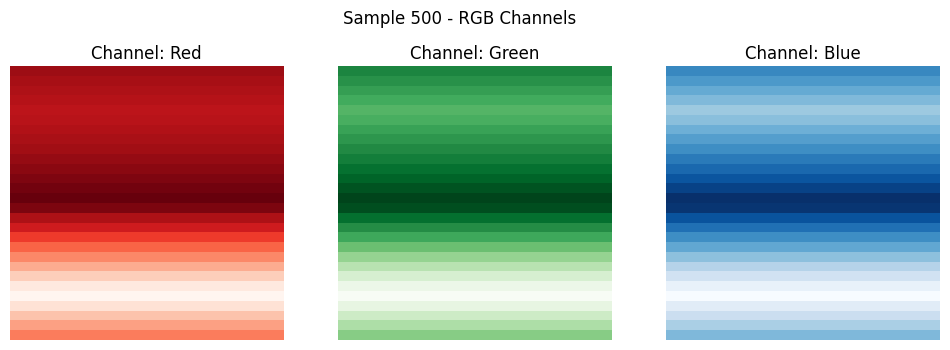

In [76]:
plot_sample_image(images_28['focus']['Subject_1']['Day_1'], 500)

### Combine the three images of red, blue, and green into one image

In [77]:

def plot_rgb_image(images, index):
    """
    Gộp 3 kênh màu (R, G, B) thành một ảnh RGB duy nhất và hiển thị.

    Args:
        images (numpy array): Dữ liệu ảnh với shape (597, 3, 28, 28).
        index (int): Chỉ số của ảnh cần vẽ.
    """
    # Lấy ảnh tại chỉ số index
    image = images[index]

    # Gộp các kênh màu thành một ảnh RGB
    rgb_image = np.transpose(image, (1, 2, 0))  # Chuyển từ (3, 28, 28) -> (28, 28, 3)

    # Vẽ ảnh RGB
    plt.imshow(rgb_image)
    plt.axis('off')  # Tắt trục tọa độ
    plt.title(f'Sample {index} - RGB Image')
    plt.show()

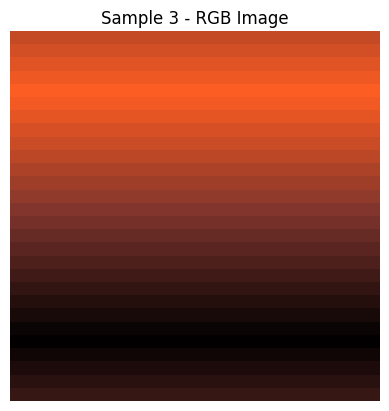

In [78]:
plot_rgb_image(images_28['focus']['Subject_1']['Day_1'], 3)

In [79]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import numpy as np
from sklearn.model_selection import train_test_split

### Data preparation

In [80]:
class ImageDataset(Dataset):
    def __init__(self, images, labels):
        self.images = torch.tensor(images, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.long)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx]

# Hàm chuẩn bị dữ liệu từ dict
def prepare_data(images_dict):
    all_images = []
    all_labels = []

    for state in images_dict:
        for subject in images_dict[state]:
            for day in images_dict[state][subject]:
                images_data = images_dict[state][subject][day]
                all_images.append(images_data)

                # Gán nhãn theo 3 trạng thái: 'focus', 'unfocus', 'drowsy'
                label = state
                if label == 'focus':
                    label_idx = 0  # Nhãn 0 cho 'focus'
                elif label == 'unfocus':
                    label_idx = 1  # Nhãn 1 cho 'unfocus'
                elif label == 'drowsy':
                    label_idx = 2  # Nhãn 2 cho 'drowsy'
                else:
                    raise ValueError(f"Trạng thái không hợp lệ: {label}")

                # Thêm nhãn vào danh sách
                all_labels.extend([label_idx] * images_data.shape[0])

    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.array(all_labels)

    # Chuẩn hóa ảnh (từ 0-255 sang 0-1)
    all_images = all_images / 255.0

    return all_images, all_labels

In [81]:
X, y = prepare_data(images_28)

# Chuyển dữ liệu thành tensor PyTorch
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.long)

# Chia dữ liệu thành tập huấn luyện và kiểm tra
X_train, X_test, y_train, y_test = train_test_split(X_tensor, y_tensor, test_size=0.2, random_state=42)

train_dataset = ImageDataset(X_train, y_train)
test_dataset = ImageDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

### Train the model

In [82]:
#  Xây dựng mô hình CNN
class CNNModel(nn.Module):
    def __init__(self, num_classes=3):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.relu = nn.ReLU()

        # Số lượng đầu vào của fc1 phụ thuộc vào kích thước sau pooling
        self.fc1_input_dim = 64 * 3 * 3  # Thay đổi kích thước này nếu ảnh có kích thước khác
        self.fc1 = nn.Linear(self.fc1_input_dim, 128)
        self.fc2 = nn.Linear(128, num_classes)  # 3 lớp (focus, distract, sleepy)

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = self.pool(self.relu(self.conv3(x)))
        x = x.view(-1, self.fc1_input_dim)  # Làm phẳng tensor
        x = self.relu(self.fc1(x))
        x = self.fc2(x)
        return x


In [83]:
#  Khởi tạo mô hình, loss function và optimizer
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CNNModel(num_classes=3).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [84]:
np.random.seed(42)
def train_model(model, train_loader, criterion, optimizer, epochs=10):
    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()

            # Forward pass
            outputs = model(images)

            # Tính loss
            loss = criterion(outputs, labels)

            # Backward pass và cập nhật trọng số
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Tính số lượng dự đoán đúng
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(train_loader):.4f}, Accuracy: {100 * correct/total:.2f}%")

def evaluate_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = correct / total
    return accuracy

In [85]:
train_model(model, train_loader, criterion, optimizer, epochs=20)

Epoch 1/20, Loss: 1.0987, Accuracy: 33.65%
Epoch 2/20, Loss: 1.0987, Accuracy: 33.36%
Epoch 3/20, Loss: 1.0987, Accuracy: 33.09%
Epoch 4/20, Loss: 1.0987, Accuracy: 33.51%
Epoch 5/20, Loss: 1.0987, Accuracy: 33.57%
Epoch 6/20, Loss: 1.0987, Accuracy: 33.25%
Epoch 7/20, Loss: 1.0987, Accuracy: 33.09%
Epoch 8/20, Loss: 1.0987, Accuracy: 33.30%
Epoch 9/20, Loss: 1.0987, Accuracy: 33.42%
Epoch 10/20, Loss: 1.0987, Accuracy: 33.10%
Epoch 11/20, Loss: 1.0987, Accuracy: 32.90%
Epoch 12/20, Loss: 1.0987, Accuracy: 33.31%
Epoch 13/20, Loss: 1.0987, Accuracy: 33.12%
Epoch 14/20, Loss: 1.0987, Accuracy: 33.12%
Epoch 15/20, Loss: 1.0987, Accuracy: 33.18%
Epoch 16/20, Loss: 1.0986, Accuracy: 33.63%
Epoch 17/20, Loss: 1.0987, Accuracy: 33.28%
Epoch 18/20, Loss: 1.0986, Accuracy: 33.71%
Epoch 19/20, Loss: 1.0987, Accuracy: 32.94%
Epoch 20/20, Loss: 1.0987, Accuracy: 33.31%


In [86]:
evaluate_model(model, test_loader)

0.32916616094186185

Việc phát triển CNN 2D cho dữ liệu EEG là hướng đi tiềm năng vì khả năng khai thác đặc trưng không gian khi dữ liệu được chuyển đổi phù hợp. EEG chứa thông tin quan trọng cả ở miền thời gian và tần số, nên việc chuyển đổi tín hiệu thành bản đồ thời gian-tần số (spectrogram) giúp CNN 2D học đặc trưng tốt hơn. Ngoài ra, nếu dữ liệu được sắp xếp lại dựa trên vị trí các điện cực EEG, CNN 2D có thể khai thác mối quan hệ không gian giữa các kênh. CNN 2D cũng nổi bật trong việc học các đặc trưng cục bộ thông qua các kernel và có thể mở rộng hiệu quả khi kết hợp với mô hình LSTM để học cả đặc trưng thời gian và không gian. Sự thành công của CNN 2D trong phân tích hình ảnh và dữ liệu thời gian-tần số là cơ sở cho việc ứng dụng vào dữ liệu EEG khi được xử lý đúng cách.